# Modèles de machine learning classification

## Objectifs de ce notebook

Dans ce notebook, nous allons tester différents modèles de machine learning pour la prédiction des seuils de promotion:

## Prédiction classification binaire: 50% réduction avant 1 an

### Données utilisées

Utilisation du fichier nettoyé dataset jeux ps5 avec travail sur les features réalisé: **featured_games_dataset_final.csv**.

- modélisation avec les données de bases
- modélisation avec les données après feature engineering

### Phase 1: Réaliser un premier entrainement de base:
- **Utilisation des features initiales non retravaillées**
- **Modèle Random Forest vu pendant la formation**
- **Preprocess des features pour Random Forest**

### Phase 2: Tester et comparer avec d'autres combinaisons de features

### Phase 3:  Tester et comparer avec différentes techniques de preprocess

### Phase 4: Entrainement et comparaison avec d'autres modèles
- **Constitution d'une liste de modèles ML avec range d'hyper-paramétres grid search**
- **Preprocess adaptés à certains type de modèles**

### Phase 5: Expérimenter sur d'autres target de prédiction

- Classification binaire sur d'autre timestep et seuile de promotion
- Classification multi (5 classes de seuil temporel pour un seuil de promotion)
- Régression : nombre de jours avant d'ateindre un seuil de promotion

## Note sur les librairies utilisées

Ce notebook utilise scikit learn pour la partie machine learning

## Import des librairies

In [ ]:
# Python base
import sys
from pathlib import Path
import os

# Bibliothèques principales
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import (
    StandardScaler,
    MinMaxScaler,
    OneHotEncoder,
    OrdinalEncoder,
    LabelEncoder
)
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.metrics import (
    accuracy_score,
)
from sklearn.model_selection import cross_val_score

from sklearn.ensemble import (
    RandomForestClassifier,
    GradientBoostingClassifier,
)

from sklearn.linear_model import (
    LinearRegression,
)

from sklearn.ensemble import (
    RandomForestRegressor,
)

from sklearn.svm import SVC


from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RandomizedSearchCV

from sklearn.metrics import mean_absolute_error, r2_score, root_mean_squared_error,accuracy_score

import warnings

warnings.filterwarnings("ignore")

## Méthodes utiles

In [656]:
def column_summary(df: pd.DataFrame):
    summary = []
    for col in df.columns:
        col_type = df[col].dtype
        non_null = df[col].notna().sum()
        null_count = df[col].isna().sum()

        # Gérer le cas où la colonne contient des listes (unhashable)
        try:
            unique_count = df[col].nunique()
        except TypeError:
            # Si erreur (listes), convertir en string temporairement
            unique_count = df[col].astype(str).nunique()
            print(
                f"⚠️ Colonne '{col}' contient des types non-hashable (probablement des listes)"
            )

        summary.append(
            {
                "Column": col,
                "Type": str(col_type),
                "Non-Null Count": non_null,
                "Null Count": null_count,
                "Unique Values": unique_count,
            }
        )

    # Afficher le résumé des colonnes
    print("=" * 80)
    print("Résumé détaillé des colonnes:")
    print("=" * 80)
    column_summary_df = pd.DataFrame(summary)
    print(column_summary_df.to_string(index=False))
    print("\n")

In [657]:
def print_features_vertical(features_dict):
    print("\n" + "=" * 80)
    print("FEATURES PAR CATÉGORIE")
    print("=" * 80)

    total_features = 0

    for category, columns in features_dict.items():
        print(
            f"\n--- {category.upper().replace('_', ' ')} ({len(columns)} features) ---"
        )
        for i, col in enumerate(columns, 1):
            print(f"  {i:2d}. {col}")
        total_features += len(columns)

    print("\n" + "=" * 80)
    print(f"TOTAL: {total_features} features")
    print("=" * 80 + "\n")

## Chargement des données

In [658]:
path = os.path.join(Path.cwd().parent, "data/processed")

In [659]:
# Charger les données CSV pour verifier
df_dataset = pd.read_csv(os.path.join(path, "featured_games_dataset_final.csv"))

In [660]:
column_summary(df_dataset)

Résumé détaillé des colonnes:
                                 Column    Type  Non-Null Count  Null Count  Unique Values
                               id_store  object            5382           0           5382
                  pssstore_stars_rating float64            5382           0            352
            pssstore_stars_rating_count   int64            5382           0           1583
                metacritic_critic_score float64            1268        4114             67
                                 is_ps4   int64            5382           0              2
                               is_indie   int64            5382           0              2
                                 is_dlc   int64            5382           0              1
                                  is_vr   int64            5382           0              2
                        is_opti_ps5_pro   int64            5382           0              2
                            is_remaster   int64            5

In [661]:
df_dataset.head()

,id_store,pssstore_stars_rating,pssstore_stars_rating_count,metacritic_critic_score,is_ps4,is_indie,is_dlc,is_vr,is_opti_ps5_pro,is_remaster,...,content_score,content_category,exclusif_playstation_content,visibility_score,visibility_category,pegi_unified,price_category,game_age_years,release_season,log_pssstore_stars_rating_count
0,EP8311-PPSA19174_00-0421646910657705,1.57,14,NaN,0,0,0,0,0,0,...,9.0,minimal,0,7.0,obscure,7,0 - 7.99,2,fall,2.708050
1,EP2005-PPSA06055_00-SINUCA0000000000,3.26,72,NaN,0,0,0,0,0,0,...,3.0,minimal,0,43.0,moderate,3,0 - 7.99,3,spring,4.290459
2,EP8311-PPSA16513_00-0233078860249892,1.55,11,NaN,0,0,0,0,0,0,...,9.0,minimal,0,7.0,obscure,3,0 - 7.99,2,spring,2.484907
3,EP8311-PPSA13840_00-0277389480637871,1.44,18,NaN,0,0,0,0,0,0,...,9.0,minimal,0,8.0,obscure,3,0 - 7.99,2,winter,2.944439
4,EP8311-PPSA12662_00-0212989199890961,1.17,23,NaN,0,0,0,0,0,0,...,9.0,minimal,0,8.0,obscure,3,0 - 7.99,3,winter,3.178054


## Rappel des features disponibles

In [662]:
# 47 features au total

# X Basic features simple sans traitement avancés (28)

# base_price                    - numeric (float)
# pssstore_stars_rating_count   - numeric (int)
# pssstore_stars_rating         - numeric (float)
# is_indie                      - boolean
# has_microtransactions         - boolean
# dlcs_count                        - numeric (int)
# packs_deluxe_count            - numeric (int)
# series_count                   - numeric (int)
# trophies_count                - numeric (int)
# is_vr                         - boolean
# has_local_multiplayer         - boolean
# has_online_multiplayer        - boolean
# is_online_only                - boolean
# is_opti_ps5_pro               - boolean
# is_ps_exclusive               - boolean
# difficulty                    - numeric (int)
# is_remaster                   - boolean
# is_ps4                        - boolean
# pegi_unified                  - category (numeric)
# metacritic_critic_score       - numeric (float)
# hours_main_story              - numeric (float)
# voice_languages_count        - numeric (int)
# sub_languages_count           - numeric (int)
# download_size_gb              - numeric (float)
# price_category                - category


#  X Advanced features engineered (19)

# popularity_score              - numeric (float)
# popularity_category           - category
# visibility_score              - numeric (float)
# visibility_category           - category
# exclusif_playstation_content  - boolean
# publisher_game_count          - numeric (int)
# publisher_game_count_cat      - category
# publisher_category            - category
# genre_action_aventure         - boolean
# genre_roles                   - boolean
# genre_sports                  - boolean
# genre_reflexion               - boolean
# genre_rapide                  - boolean
# localization_category         - category
# download_size_category        - category
# content_score                 - numeric (float)
# content_category              - category
# game_age_years                - numeric (int)
# month_sin                     - numeric (float)
# month_cos                     - numeric (float)
# release_season                - category
# log_pssstore_stars_rating_count - numeric


#  X Bonus observations à + 60 jours (2)

# has_5pct_discount_at_30d      - boolean
# has_10pct_discount_at_60d     - boolean

# Y
#
# Regression nombre de jours
#
# days_to_10_percent_discount - numeric (int)
# days_to_25_percent_discount - numeric (int)
# days_to_33_percent_discount - numeric (int)
# days_to_50_percent_discount - numeric (int)
# days_to_75_percent_discount - numeric (int)

# Classification tranche délais avant promotion

# Classification binaires:

# has_33_percent_discount_before_0.6_year
# has_50_percent_discount_before_1_year
# has_75_percent_discount_before_3_year
#
# Classification multiples:

# days_to_10_percent_discount_category - category
# days_to_25_percent_discount_category - category
# days_to_33_percent_discount_category - category
# days_to_50_percent_discount_category - category
# days_to_75_percent_discount_category - category

In [663]:
def get_all_features_columns(features_dict):
    all_columns = []
    for feature_list in features_dict.values():
        all_columns.extend(feature_list)
    return all_columns

## Préparation de la target à prédire

**Prédiction classification binaire: 50% réduction avant 1 an**

In [664]:
df_binary_disc = df_dataset.copy()

In [ ]:
TARGET_PROMO_BINNARY_COL = "has_50_percent_discount_before_1_year"

### Nettoyage des données qui ne possèdent pas la target (None)

In [666]:
# On supprime les lignes (jeux récent n'ayant jamais ateind la promotion)
df_binary_disc = df_binary_disc.dropna(subset=[TARGET_PROMO_BINNARY_COL])

print(df_binary_disc[TARGET_PROMO_BINNARY_COL].value_counts())

print(f"Avant: {len(df_dataset)} lignes")
print(f"Après: {len(df_binary_disc)} lignes")

has_50_percent_discount_before_1_year
1.0    2245
0.0    1885
Name: count, dtype: int64
Avant: 5382 lignes
Après: 4130 lignes


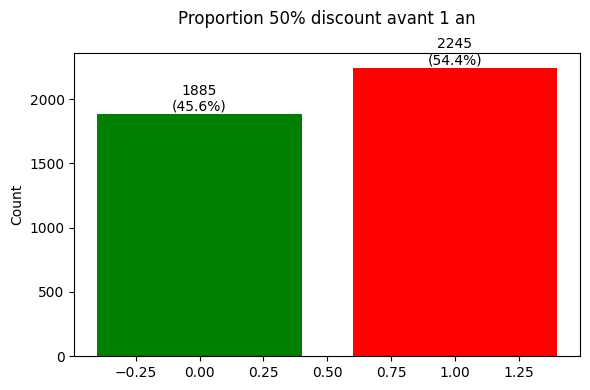

In [667]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

counts = df_binary_disc[TARGET_PROMO_BINNARY_COL].value_counts()
ax: plt.Axes
bars = ax.bar(counts.index, counts.values, color=["red", "green"])
ax.set_title("Proportion 50% discount avant 1 an\n")
ax.set_ylabel("Count")

# Ajouter pourcentages
for bar in bars:
    height = bar.get_height()
    pct = height / len(df_binary_disc[TARGET_PROMO_BINNARY_COL]) * 100
    ax.text(
        bar.get_x() + bar.get_width() / 2.0,
        height,
        f"{int(height)}\n({pct:.1f}%)",
        ha="center",
        va="bottom",
    )

plt.tight_layout()
plt.show()

## Phase 1: Réaliser un premier entrainement de base:

### Sélection des features X 

- Features disponible à J0 date de sortie
- Utilisation des features avec les meilleures corrélation vu pendant les phases préparatoire
- Attention aux features qui ne pourrait pas être récupérable lors de la production
- Attention à ne pas avoir plusieurs colonne portant la même information
- Attention data leakage (age du jeu enlevé, popularité)

In [668]:
# Premier set de base raisonable (28 features) infos récupérable à J0
phase1_features = {
    "numeric_continuous": [
        "base_price",  # 0.116
        "download_size_gb",  # 0.079
        "hours_main_story",  # Info disponible dès J0 (HowLongToBeat)
    ],
    "numeric_discrete_zero": [
        "voice_languages_count",  # 0.110 - Info disponible dès J0
        "dlcs_count",  # Info disponible dès J0
        "trophies_count",  # Info disponible dès J0
        "series_count",  # Info disponible dès J0
        "packs_deluxe_count",  # Info disponible dès J0
    ],
    "boolean_cols": [
        "has_local_multiplayer",  # 0.124 - Info disponible dès J0
        "has_online_multiplayer",  # 0.085 - Info disponible dès J0
        "has_microtransactions",  # 0.093 - Info disponible dès J0
        "is_indie",  # Info disponible dès J0
        "is_vr",  # Info disponible dès J0
        "is_ps_exclusive",  # Info disponible dès J0
        "is_online_only",  # Info disponible dès J0
        "is_remaster",  # Info disponible dès J0
        "is_opti_ps5_pro",  # Info disponible dès J0
        "is_ps4",  # Info disponible dès J0
        "genre_action_aventure",  # Info disponible dès J0
        "genre_roles",  # Info disponible dès J0
        "genre_sports",  # Info disponible dès J0
        "genre_reflexion",  # Info disponible dès J0
        "genre_rapide",  # Info disponible dès J0
    ],
    "categorical_cols": [
        "release_season",  # 0.086 - Info disponible dès J0
        "publisher_category",  # 0.080 - Info disponible dès J0
        "content_category",  # 0.100 - Calculable dès J0
    ],
    "ordinal_cols": [
        "pegi_unified",  # Info disponible dès J0
        "difficulty",  # Info disponible dès J0 (si disponible)
    ],
}

In [669]:
FEATURES_TO_USE_PHASE_1 = phase1_features

In [670]:
print_features_vertical(FEATURES_TO_USE_PHASE_1)


FEATURES PAR CATÉGORIE

--- NUMERIC CONTINUOUS (3 features) ---
   1. base_price
   2. download_size_gb
   3. hours_main_story

--- NUMERIC DISCRETE ZERO (5 features) ---
   1. voice_languages_count
   2. dlcs_count
   3. trophies_count
   4. series_count
   5. packs_deluxe_count

--- BOOLEAN COLS (15 features) ---
   1. has_local_multiplayer
   2. has_online_multiplayer
   3. has_microtransactions
   4. is_indie
   5. is_vr
   6. is_ps_exclusive
   7. is_online_only
   8. is_remaster
   9. is_opti_ps5_pro
  10. is_ps4
  11. genre_action_aventure
  12. genre_roles
  13. genre_sports
  14. genre_reflexion
  15. genre_rapide

--- CATEGORICAL COLS (3 features) ---
   1. release_season
   2. publisher_category
   3. content_category

--- ORDINAL COLS (2 features) ---
   1. pegi_unified
   2. difficulty

TOTAL: 28 features



In [671]:
base_X_features = get_all_features_columns(FEATURES_TO_USE_PHASE_1)

# Sélectionner les colonnes disponibles
X = df_binary_disc[base_X_features]

# On assigne la target
y = df_binary_disc[TARGET_PROMO_BINNARY_COL]

### Création train test split

In [672]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

total = len(X_train) + len(X_test)
print(
    f"\nTrain: {len(X_train)} ({len(X_train)/total*100:.1f}%) | Test: {len(X_test)} ({len(X_test)/total*100:.1f}%)"
)


Train: 3304 (80.0%) | Test: 826 (20.0%)


### Preprocessing phase 1 pour random forest

1. Numériques continues → Imputation + Scaling (si nécessaire)
2. Numériques discrètes → Imputation 
3. Booléennes → Format 0/1
4. Ordinales → Garder l'ordre naturel
5. Nominales → Label Encoding

#### Zero imputer pour pipeline scikit learn

In [673]:
class ZeroImputer(BaseEstimator, TransformerMixin):
    """Impute les valeurs manquantes par 0"""

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        if isinstance(X, pd.DataFrame):
            return X.fillna(0)
        else:
            # Si numpy array
            X_copy = X.copy()
            X_copy[np.isnan(X_copy)] = 0
            return X_copy

    def get_feature_names_out(self, input_features=None):
        """Retourne les noms des features (inchangés)"""
        return input_features

#### Création pipeline sci-kit learn phase 1

In [674]:
def create_pipeline_random_forest(available_columns: dict):

    # Crée un Pipeline sklearn pour le preprocessing
    #     X_train_processed = pipeline.fit_transform(X_train)
    #     X_test_processed = pipeline.transform(X_test)

    # Liste pour stocker tous les transformers
    transformers = []

    # NUMÉRIQUES CONTINUES
    filtered_numeric_continuous = available_columns.get("numeric_continuous", [])

    # TREE: Juste imputation, scaling pas obligatoire pour random forest
    numeric_continuous_transformer = Pipeline(
        steps=[("imputer", SimpleImputer(strategy="median"))]
    )

    if filtered_numeric_continuous is not None and len(filtered_numeric_continuous) > 0:
        transformers.append(
            (
                "num_continuous",
                numeric_continuous_transformer,
                filtered_numeric_continuous,
            )
        )

    # NUMERIQUES DISCRETES zéro
    numeric_discrete_zero = available_columns.get("numeric_discrete_zero", [])

    numeric_discrete_zero_transformer = Pipeline(
        steps=[("zero_imputer", ZeroImputer())]
    )

    if numeric_discrete_zero is not None and len(numeric_discrete_zero) > 0:
        transformers.append(
            (
                "num_discrete_zero",
                numeric_discrete_zero_transformer,
                numeric_discrete_zero,
            )
        )

    # NUMERIQUES DISCRETES imputation médiane
    numeric_discrete_median = available_columns.get("numeric_discrete_median", [])

    numeric_discrete_median_transformer = Pipeline(
        steps=[("imputer", SimpleImputer(strategy="median"))]
    )

    if numeric_discrete_median is not None and len(numeric_discrete_median) > 0:
        transformers.append(
            (
                "num_discrete_median",
                numeric_discrete_median_transformer,
                numeric_discrete_median,
            )
        )

    # BOOLÉENNES
    boolean_cols = available_columns.get("boolean_cols", [])
    boolean_transformer = Pipeline(
        steps=[("zero_imputer", ZeroImputer())]  # Remplacer NA par 0
    )

    if boolean_cols is not None and len(boolean_cols) > 0:
        transformers.append(("boolean", boolean_transformer, boolean_cols))

    # CATÉGORIELLES
    categorical_cols = available_columns.get("categorical_cols", [])

    # TREE Label Encoding (via OrdinalEncoder)
    categorical_transformer = Pipeline(
        steps=[
            ("imputer", SimpleImputer(strategy="constant", fill_value="unknown")),
            (
                "encoder",
                OrdinalEncoder(
                    handle_unknown="use_encoded_value",
                    unknown_value=-1,
                    encoded_missing_value=-1,
                ),
            ),
        ]
    )

    if categorical_cols is not None and len(categorical_cols) > 0:
        transformers.append(("categorical", categorical_transformer, categorical_cols))

    # ORDINALES
    ordinal_cols = available_columns.get("ordinal_cols", [])

    ordinal_transformer = Pipeline(
        steps=[("imputer", SimpleImputer(strategy="median"))]
    )

    if len(ordinal_cols) > 0:
        transformers.append(("ordinal", ordinal_transformer, ordinal_cols))

    # SCORES
    score_cols = available_columns.get("score_cols", [])

    score_transformer = Pipeline(
        steps=[
            ("imputer", SimpleImputer(strategy="median")),
            ("scaler", StandardScaler()),
        ]
    )

    if score_cols is not None and len(score_cols) > 0:
        transformers.append(("scores", score_transformer, score_cols))

    # Colonnes Déjà normalisées, juste passer tel quel
    pass_cols = available_columns.get("passthrough_cols", [])
    pass_transformer = "passthrough"

    if pass_cols is not None and len(pass_cols) > 0:
        transformers.append(("pass", pass_transformer, pass_cols))

    # PIPELINE FINAL
    pipeline = Pipeline(
        steps=[
            (
                "preprocessor",
                ColumnTransformer(
                    transformers=transformers,
                    remainder="drop",  # Supprimer les colonnes non spécifiées
                    verbose_feature_names_out=False,  # Garder noms courts
                ),
            )
        ]
    )

    print(f"Pipeline créé avec {len(transformers)} groupes de transformers")

    return pipeline

In [675]:
pipeline_phase_1 = create_pipeline_random_forest(
    available_columns=FEATURES_TO_USE_PHASE_1
)

# Fit et transform avec le pipeline crée pour la phase 1
X_train_processed_phase_1 = pipeline_phase_1.fit_transform(X_train)
X_test_processed_phase_1 = pipeline_phase_1.transform(X_test)

print(f"\nTrain processed : {X_train_processed_phase_1.shape}")
print(f"Test processed  : {X_test_processed_phase_1.shape}")

Pipeline créé avec 5 groupes de transformers

Train processed : (3304, 28)
Test processed  : (826, 28)


In [676]:
pipeline_phase_1

,steps,"[('preprocessor', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('num_continuous', ...), ('num_discrete_zero', ...), ...]"
,remainder,'drop'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,False


### Choix de la métrique d'évaluation

Utilisation de **l'accuracy**:

- Classes équilibrées (45/55)
- Pas de conséquence forte entre réduction ou pas (FP = FN en impact métier)
    - Faux Positif (prédit réduction, n'arrive pas), utilisateur attend inutilement
    - Faux Négatif (prédit pas de réduction, arrive), utilisateur rate une promo


### Optimisation des hyper paramétres Grid Search pour Random Forest

Les paramétres de profondeurs ont été ajusté après des premiers tests (surraprentissage sur train set)

In [677]:
model = RandomForestClassifier(random_state=42, class_weight="balanced")
# Définition des hyperparamètres à tester

# OVERFITTING max depth None.

# param_grid = {
#     'n_estimators': [50, 100, 200],
#     'max_depth': [None, 10, 20, 30],
#     'min_samples_split': [2, 5],
#     'min_samples_leaf': [1, 2, 4]
# }

param_grid = {
    "n_estimators": [200, 300],
    "max_depth": [8, 10, 12],
    "min_samples_split": [10, 20],
    "min_samples_leaf": [5, 10],
}

# Configuration de la validation croisée
cv_strategy = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=42
)  # 5-fold cross-validation

# Grille de recherche
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring="accuracy",
    cv=cv_strategy,
    n_jobs=-1,
    verbose=2,
)

# Entraînement du modèle avec GridSearch
grid_search.fit(X_train_processed_phase_1, y_train)

print("\nMeilleurs hyperparamètres trouvés:")
print(grid_search.best_params_)


print(f"Meilleur score de validation: {grid_search.best_score_:.2%}")

# Entraînement du modèle avec les meilleurs hyperparamètres
best_model = grid_search.best_estimator_

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV] END max_depth=8, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=8, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=8, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=8, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=8, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   0.4s
[CV] END max_depth=8, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   0.4s
[CV] END max_depth=8, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   0.4s
[CV] END max_depth=8, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   0.4s
[CV] END max_depth=8, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=8, min_sam

### Résultats Cross-validation Random forest

In [678]:
# Récupérer les scores CV du GridSearch
cv_scores = grid_search.cv_results_["mean_test_score"]

best_cv_score = grid_search.best_score_

print(f"Meilleur score CV: {best_cv_score:.4f}")
print(f"Scores CV: {cv_scores}")
print(f"Score CV moyen: {cv_scores.mean():.4f} (environ {cv_scores.std() * 2:.4f})")

Meilleur score CV: 0.6438
Scores CV: [0.63255857 0.63134874 0.63134874 0.63316509 0.62983725 0.63074359
 0.62983725 0.63074359 0.63588594 0.63830606 0.63800669 0.63861
 0.63740292 0.63740155 0.63740292 0.63740155 0.63951955 0.64375739
 0.63589098 0.63831156 0.63528217 0.63679549 0.63528217 0.63679549]
Score CV moyen: 0.6355 (environ 0.0070)


### Prédictions

In [679]:
y_pred_train = best_model.predict(X_train_processed_phase_1)
y_pred_test = best_model.predict(X_test_processed_phase_1)

### Evaluation

- cv-score : Accuracy moyenne obtenu sur plusieurs split
- precision : Parmi les prédictions OUI, combien sont vraiment OUI ?
- recall : Parmi les vrais OUI, combien sont détectés ? évite de rater une vrai réduction, on prédit "OUI" plus souvent
- f1-score : Moyenne harmonique de precision et recall

In [680]:
train_accuracy = accuracy_score(y_train, y_pred_train)
test_accuracy = accuracy_score(y_test, y_pred_test)

print(f"Train accuracy: {train_accuracy:.4f}")
print(f"Test accuracy: {test_accuracy:.4f}")

print("\nRapport de classification (Test):")
classification_report_phase_1 = classification_report(
    y_test, y_pred_test, output_dict=True
)
print(classification_report(y_test, y_pred_test))

print("\nMatrice de confusion:")
cm = confusion_matrix(y_test, y_pred_test)
print(cm)

Train accuracy: 0.8311
Test accuracy: 0.6622

Rapport de classification (Test):
              precision    recall  f1-score   support

         0.0       0.62      0.66      0.64       377
         1.0       0.70      0.67      0.68       449

    accuracy                           0.66       826
   macro avg       0.66      0.66      0.66       826
weighted avg       0.66      0.66      0.66       826


Matrice de confusion:
[[248 129]
 [150 299]]


### Visualisation des résultats

In [681]:
def plot_classification_results(
    model, y_train, y_test, y_train_pred, y_test_pred, cv_scores, feature_names=None
):
    # Scores
    train_acc = (y_train_pred == y_train).mean()
    test_acc = (y_test_pred == y_test).mean()

    # Créer figure
    fig = plt.figure(figsize=(16, 12))
    gs = fig.add_gridspec(2, 2, hspace=0.3, wspace=0.3)

    # MATRICE DE CONFUSION
    ax1 = fig.add_subplot(gs[0, 0])

    cm = confusion_matrix(y_test, y_test_pred)

    # Heatmap
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        cbar_kws={"label": "Count"},
        ax=ax1,
        square=True,
        linewidths=1,
        linecolor="black",
    )

    ax1.set_title("MATRICE DE CONFUSION (Test)", fontweight="bold", fontsize=14)
    ax1.set_xlabel("Prédiction", fontweight="bold")
    ax1.set_ylabel("Réel", fontweight="bold")

    # Ajouter pourcentages
    total = cm.sum()
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            pct = cm[i, j] / cm[i].sum() * 100
            ax1.text(
                j + 0.5,
                i + 0.7,
                f"({pct:.1f}%)",
                ha="center",
                va="center",
                fontsize=10,
                color="gray",
            )

    # ACCURACY TRAIN VS TEST
    ax2 = fig.add_subplot(gs[0, 1])

    categories = ["Train", "Test"]
    accuracies = [train_acc, test_acc]
    colors = ["lightgreen", "lightcoral" if train_acc - test_acc > 0.1 else "lightblue"]

    bars = ax2.bar(categories, accuracies, color=colors, edgecolor="black", linewidth=2)

    # Ajouter valeurs
    for i, (cat, acc) in enumerate(zip(categories, accuracies)):
        ax2.text(
            i,
            acc + 0.02,
            f"{acc:.2%}",
            ha="center",
            va="bottom",
            fontweight="bold",
            fontsize=12,
        )

    ax2.set_ylim(0, 1.1)
    ax2.set_ylabel("Accuracy", fontweight="bold")
    ax2.set_title("ACCURACY TRAIN vs TEST", fontweight="bold", fontsize=14)
    ax2.grid(axis="y", alpha=0.3)
    ax2.axhline(y=0.5, color="red", linestyle="--", alpha=0.5, label="Hasard (50%)")

    # Overfitting warning
    overfitting_gap = train_acc - test_acc
    if overfitting_gap > 0.2:
        ax2.text(
            0.5,
            0.95,
            f"OVERFITTING\nÉcart: {overfitting_gap:.1%}",
            transform=ax2.transAxes,
            ha="center",
            va="top",
            bbox=dict(boxstyle="round", facecolor="yellow", alpha=0.7),
            fontweight="bold",
            fontsize=10,
        )

    ax2.legend()

    # CROSS-VALIDATION SCORES
    ax3 = fig.add_subplot(gs[1, 0])

    folds = np.arange(1, len(cv_scores) + 1)
    mean_cv = cv_scores.mean()
    std_cv = cv_scores.std()

    # Barplot des scores CV
    bars = ax3.bar(
        folds,
        cv_scores,
        color="steelblue",
        edgecolor="black",
        alpha=0.7,
        label="Score par fold",
    )

    # Ligne moyenne
    ax3.axhline(
        y=mean_cv,
        color="red",
        linestyle="--",
        linewidth=2,
        label=f"Moyenne: {mean_cv:.2%}",
    )

    # Zone de confiance (±2 std)
    ax3.axhspan(
        mean_cv - 2 * std_cv,
        mean_cv + 2 * std_cv,
        alpha=0.2,
        color="red",
        label=f"±2σ ({2*std_cv:.2%})",
    )

    # Ajouter valeurs
    for i, (fold, score) in enumerate(zip(folds, cv_scores)):
        ax3.text(
            fold, score + 0.01, f"{score:.3f}", ha="center", va="bottom", fontsize=9
        )

    ax3.set_xlabel("Fold", fontweight="bold")
    ax3.set_ylabel("Accuracy", fontweight="bold")
    ax3.set_title(
        f"CROSS-VALIDATION (5-Fold)\nMoyenne: {mean_cv:.2%} ± {std_cv:.2%}",
        fontweight="bold",
        fontsize=14,
    )
    ax3.set_xticks(folds)
    ax3.set_ylim(0, 1.1)
    ax3.grid(axis="y", alpha=0.3)
    ax3.legend(loc="lower right")

    # FEATURE IMPORTANCE
    ax4 = fig.add_subplot(gs[1, 1])

    # Récupérer importance
    if hasattr(model, "feature_importances_"):
        importances = model.feature_importances_

        # Si pas de feature_names, utiliser indices
        if feature_names is None:
            feature_names = [f"Feature {i}" for i in range(len(importances))]

        # Trier par importance
        indices = np.argsort(importances)[::-1]

        # Top 15 features
        top_n = min(15, len(importances))
        top_indices = indices[:top_n]
        top_importances = importances[top_indices]
        top_names = [feature_names[i] for i in top_indices]

        # Horizontal barplot
        y_pos = np.arange(len(top_names))
        bars = ax4.barh(
            y_pos, top_importances, color="mediumseagreen", edgecolor="black", alpha=0.7
        )

        # Ajouter valeurs
        for i, (name, imp) in enumerate(zip(top_names, top_importances)):
            ax4.text(imp + 0.001, i, f"{imp:.4f}", va="center", fontsize=9)

        ax4.set_yticks(y_pos)
        ax4.set_yticklabels(top_names, fontsize=9)
        ax4.set_xlabel("Importance", fontweight="bold")
        ax4.set_title(
            f"FEATURE IMPORTANCE (Top {top_n})", fontweight="bold", fontsize=14
        )
        ax4.grid(axis="x", alpha=0.3)
        ax4.invert_yaxis()

    else:
        ax4.text(
            0.5,
            0.5,
            "Feature Importance\nnon disponible\npour ce modèle",
            ha="center",
            va="center",
            fontsize=14,
            transform=ax4.transAxes,
            bbox=dict(boxstyle="round", facecolor="wheat", alpha=0.5),
        )
        ax4.set_title("FEATURE IMPORTANCE", fontweight="bold", fontsize=14)
        ax4.axis("off")

    fig.suptitle(
        f"RÉSULTATS DE CLASSIFICATION - {type(model).__name__}",
        fontsize=18,
        fontweight="bold",
        y=0.98,
    )

    return fig

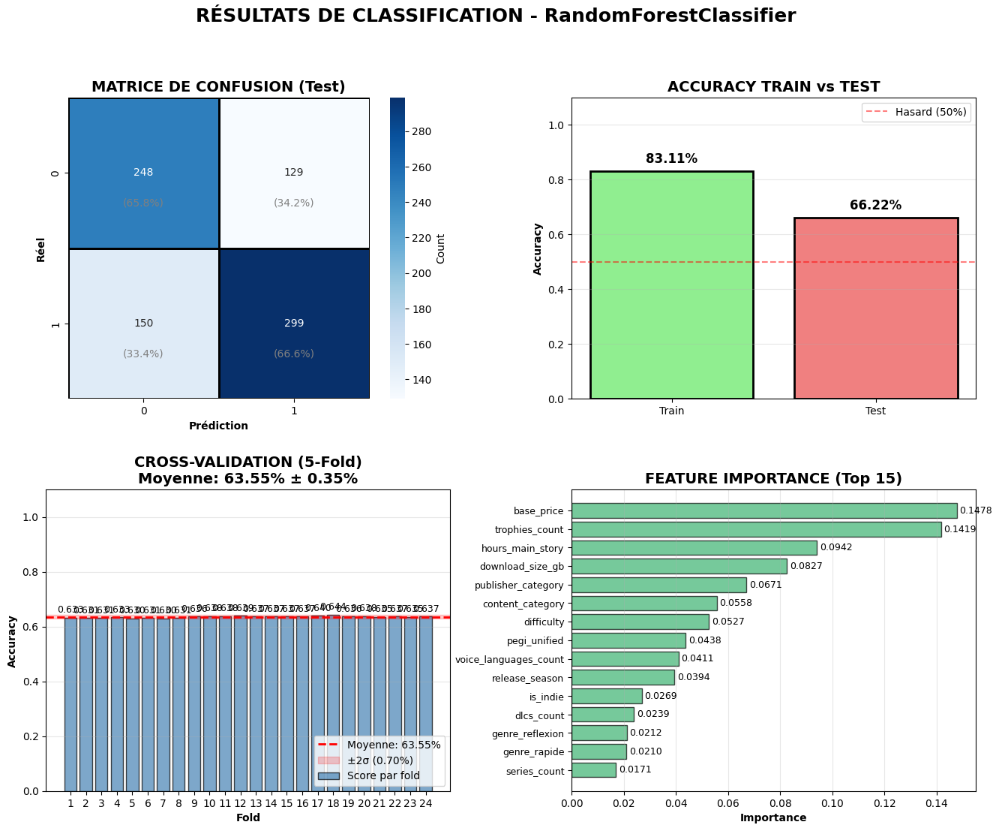

In [682]:
preprocessor = pipeline_phase_1
feature_names = list(preprocessor.get_feature_names_out())

fig = plot_classification_results(
    model=best_model,
    y_train=y_train,
    y_test=y_test,
    y_train_pred=y_pred_train,
    y_test_pred=y_pred_test,
    cv_scores=cv_scores,
    feature_names=feature_names,
)

## Phase 2 Tester sur d'autres combinaison de features

### Ajout des features d'observation à J+60

In [683]:
# PHASE 1 : Prédiction dès J0 (sortie du jeu)
phase1_features = phase1_features  # 32 features sans leakage

# PHASE 2 : Prédiction à J+60 (avec observations précoces)
phase2_features_base_j60 = {
    **phase1_features,
    "numeric_discrete_median": [
        # "pssstore_stars_rating_count",
        # Votes accumulés à J+60 biais ici, utiliser popularity_score pondéré avec age (plus de vote si jeu sur le marché dupuis longtemps)
    ],
    "numeric_continuous": phase1_features["numeric_continuous"]
    + [
        "pssstore_stars_rating",  # Note moyenne à J+60
        "metacritic_critic_score",  # Score Metacritic (souvent dispo à J+30)
    ],
    "boolean_cols": phase1_features["boolean_cols"]
    + [
        "has_5pct_discount_at_30d",  # Observe réduction à J+30
        "has_10pct_discount_at_60d",  # Observe réduction à J+60
    ],
    "categorical_cols": phase1_features["categorical_cols"]
    + [
        "popularity_category",  # Catégorie popularité basée sur votes à J+60 (pondéré avec age du jeu)
    ],
}

In [684]:
FEATURES_TO_USE_PHASE_2_J60 = phase2_features_base_j60

In [685]:
print_features_vertical(FEATURES_TO_USE_PHASE_2_J60)


FEATURES PAR CATÉGORIE

--- NUMERIC CONTINUOUS (5 features) ---
   1. base_price
   2. download_size_gb
   3. hours_main_story
   4. pssstore_stars_rating
   5. metacritic_critic_score

--- NUMERIC DISCRETE ZERO (5 features) ---
   1. voice_languages_count
   2. dlcs_count
   3. trophies_count
   4. series_count
   5. packs_deluxe_count

--- BOOLEAN COLS (17 features) ---
   1. has_local_multiplayer
   2. has_online_multiplayer
   3. has_microtransactions
   4. is_indie
   5. is_vr
   6. is_ps_exclusive
   7. is_online_only
   8. is_remaster
   9. is_opti_ps5_pro
  10. is_ps4
  11. genre_action_aventure
  12. genre_roles
  13. genre_sports
  14. genre_reflexion
  15. genre_rapide
  16. has_5pct_discount_at_30d
  17. has_10pct_discount_at_60d

--- CATEGORICAL COLS (4 features) ---
   1. release_season
   2. publisher_category
   3. content_category
   4. popularity_category

--- ORDINAL COLS (2 features) ---
   1. pegi_unified
   2. difficulty

--- NUMERIC DISCRETE MEDIAN (0 features) 

In [737]:
def complete_random_forest_train(features_to_use, pipeline_custom=None, show_plot=True,custom_X = None,custom_y=None,eval_score="accuracy"):
    base_X_features = get_all_features_columns(features_to_use)

    if custom_X is not None:
        X = custom_X
    else:
        # Sélectionner les colonnes disponibles
        X = df_binary_disc[base_X_features]

    if custom_y is not None:
        y = custom_y
    else:
        # On assigne la target (n'a pas changé)
        y = df_binary_disc[TARGET_PROMO_BINNARY_COL]

    X_train, X_test, y_train, y_test = train_test_split(
        X,
        y,
        test_size=0.2,
        random_state=42,  # Meme reproductibilité pour comparer modèles
        stratify=y,
    )

    total = len(X_train) + len(X_test)
    print(
        f"\nTrain: {len(X_train)} ({len(X_train)/total*100:.1f}%) | Test: {len(X_test)} ({len(X_test)/total*100:.1f}%)"
    )

    if pipeline_custom is None:
        pipeline = create_pipeline_random_forest(available_columns=features_to_use)
    else:
        pipeline = pipeline_custom

    # Fit et transform avec le pipeline crée pour la phase 1
    X_train_processed = pipeline.fit_transform(X_train)
    X_test_processed = pipeline.transform(X_test)

    print(f"\nTrain processed : {X_train_processed.shape}")
    print(f"Test processed  : {X_test_processed.shape}")

    model = RandomForestClassifier(random_state=42, class_weight="balanced")

    param_grid = {
        "n_estimators": [100, 150,200],
        "max_depth": [6, 8, 10],
        "min_samples_split": [20, 30,40],
        "min_samples_leaf": [10, 15,20],
        "max_features": ['sqrt', 'log2', 0.6],
        "max_samples": [0.7, 0.8, 0.9],
    }

    # Configuration de la validation croisée
    cv_strategy = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=42
    )  # 5-fold cross-validation

    # Grille de recherche
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        scoring=eval_score,
        cv=cv_strategy,
        n_jobs=-1,
        verbose=2,
    )

    # Entraînement du modèle avec GridSearch
    grid_search.fit(X_train_processed, y_train)

    print("\nMeilleurs hyperparamètres trouvés:")
    print(grid_search.best_params_)

    print(f"Meilleur score de validation: {grid_search.best_score_:.2%}")

    # Entraînement du modèle avec les meilleurs hyperparamètres
    best_model = grid_search.best_estimator_

    # Récupérer les scores CV du GridSearch
    cv_scores = grid_search.cv_results_["mean_test_score"]

    best_cv_score = grid_search.best_score_

    print(f"Meilleur score CV: {best_cv_score:.4f}")
    print(f"Scores CV: {cv_scores}")
    print(f"Score CV moyen: {cv_scores.mean():.4f} (environ {cv_scores.std() * 2:.4f})")

    y_pred_train = best_model.predict(X_train_processed)
    y_pred_test = best_model.predict(X_test_processed)

    train_accuracy = accuracy_score(y_train, y_pred_train)
    test_accuracy = accuracy_score(y_test, y_pred_test)

    print(f"Train accuracy: {train_accuracy:.4f}")
    print(f"Test accuracy: {test_accuracy:.4f}")

    print("\nRapport de classification (Test):")
    classification_report_res = classification_report(
        y_test, y_pred_test, output_dict=True
    )
    print(classification_report(y_test, y_pred_test))

    print("\nMatrice de confusion:")
    cm = confusion_matrix(y_test, y_pred_test)
    print(cm)

    preprocessor = pipeline
    feature_names = list(preprocessor.get_feature_names_out())

    if show_plot:
        fig = plot_classification_results(
            model=best_model,
            y_train=y_train,
            y_test=y_test,
            y_train_pred=y_pred_train,
            y_test_pred=y_pred_test,
            cv_scores=cv_scores,
            feature_names=feature_names,
        )

    return classification_report_res


Train: 3304 (80.0%) | Test: 826 (20.0%)
Pipeline créé avec 5 groupes de transformers

Train processed : (3304, 33)
Test processed  : (826, 33)
Fitting 5 folds for each of 729 candidates, totalling 3645 fits
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=30, n

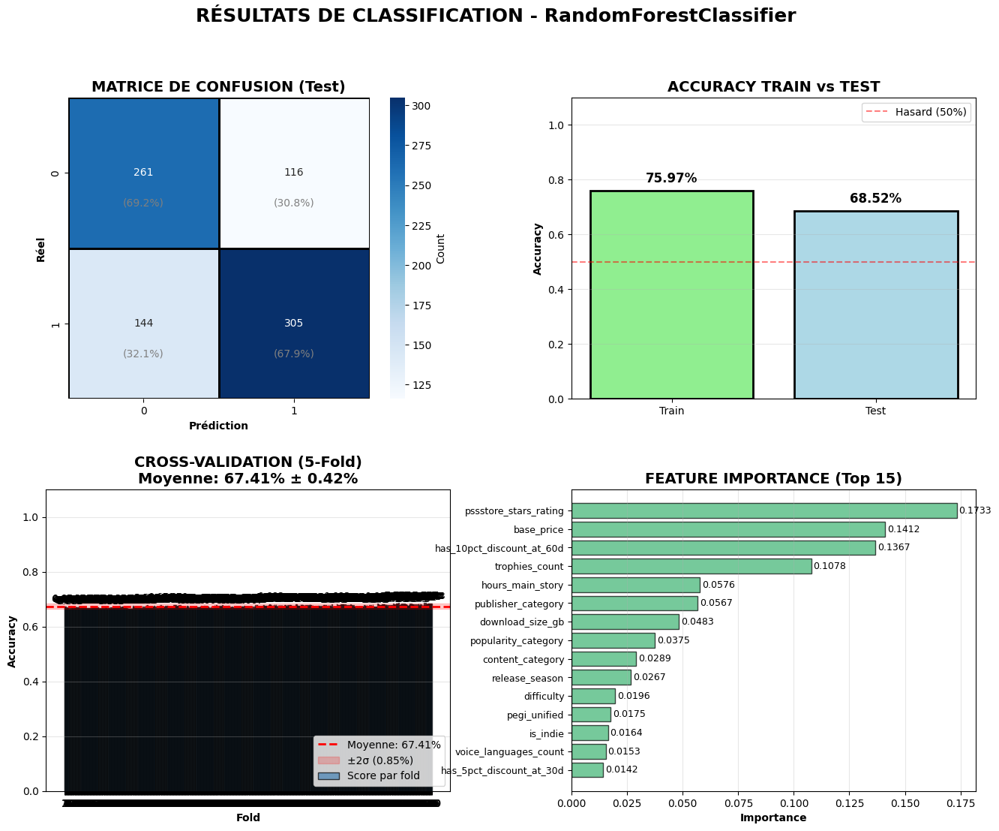

In [ ]:
classification_report_phase_2_j60 = complete_random_forest_train(
    FEATURES_TO_USE_PHASE_2_J60
)


In [688]:
def compare_classification_reports(models_reports, save_path=None):
    if not models_reports or len(models_reports) < 2:
        raise ValueError("Vous devez fournir au moins 2 modèles à comparer")

    # Couleurs pour jusqu'à 6 modèles
    colors = ["#3498db", "#e74c3c", "#2ecc71", "#f39c12", "#9b59b6", "#1abc9c"]

    # Métriques à extraire
    metrics = ["Precision", "Recall", "F1-Score", "Accuracy"]

    # Extraire les valeurs pour chaque modèle
    all_values = []
    model_names = []

    for model in models_reports:
        report = model["report"]
        name = model["name"]

        # Gérer les différentes clés possibles pour weighted avg
        weighted_key = "weighted avg" if "weighted avg" in report else "weighted_avg"

        values = [
            report[weighted_key]["precision"],
            report[weighted_key]["recall"],
            report[weighted_key]["f1-score"],
            report["accuracy"],
        ]

        all_values.append(values)
        model_names.append(name)

    # Créer le graphique
    n_models = len(models_reports)
    n_metrics = len(metrics)

    x = np.arange(n_metrics)
    width = 0.8 / n_models  # Ajuster la largeur selon le nombre de modèles

    fig, ax = plt.subplots(figsize=(12, 6))

    # Créer les barres pour chaque modèle
    bars_list = []
    for i, (values, name) in enumerate(zip(all_values, model_names)):
        offset = width * (i - n_models / 2 + 0.5)
        bars = ax.bar(
            x + offset,
            values,
            width,
            label=name,
            color=colors[i % len(colors)],
            alpha=0.8,
        )
        bars_list.append(bars)

    # Ajouter les valeurs sur les barres
    for bars in bars_list:
        for bar in bars:
            height = bar.get_height()
            ax.text(
                bar.get_x() + bar.get_width() / 2.0,
                height,
                f"{height:.3f}",
                ha="center",
                va="bottom",
                fontsize=9,
                fontweight="bold",
            )

    # Personnalisation
    ax.set_ylabel("Score", fontsize=12, fontweight="bold")
    ax.set_title("Comparaison des Performances", fontsize=14, fontweight="bold")
    ax.set_xticks(x)
    ax.set_xticklabels(metrics, fontsize=11)
    ax.legend(fontsize=10, loc="lower right")
    ax.set_ylim([0, 1.05])
    ax.grid(axis="y", alpha=0.3, linestyle="--")

    plt.tight_layout()

    # Afficher tableau comparatif
    print("\n" + "=" * 80)
    print("TABLEAU COMPARATIF DES MODÈLES")
    print("=" * 80)

    # Header
    header = f"{'Métrique':<15}"
    for name in model_names:
        header += f"{name:<20}"
    print(header)
    print("-" * 80)

    # Lignes de métriques
    for i, metric in enumerate(metrics):
        row = f"{metric:<15}"
        for values in all_values:
            row += f"{values[i]:<20.3f}"
        print(row)


TABLEAU COMPARATIF DES MODÈLES
Métrique       Base Features       Post-Release (J+60) 
--------------------------------------------------------------------------------
Precision      0.664               0.688               
Recall         0.662               0.685               
F1-Score       0.663               0.686               
Accuracy       0.662               0.685               


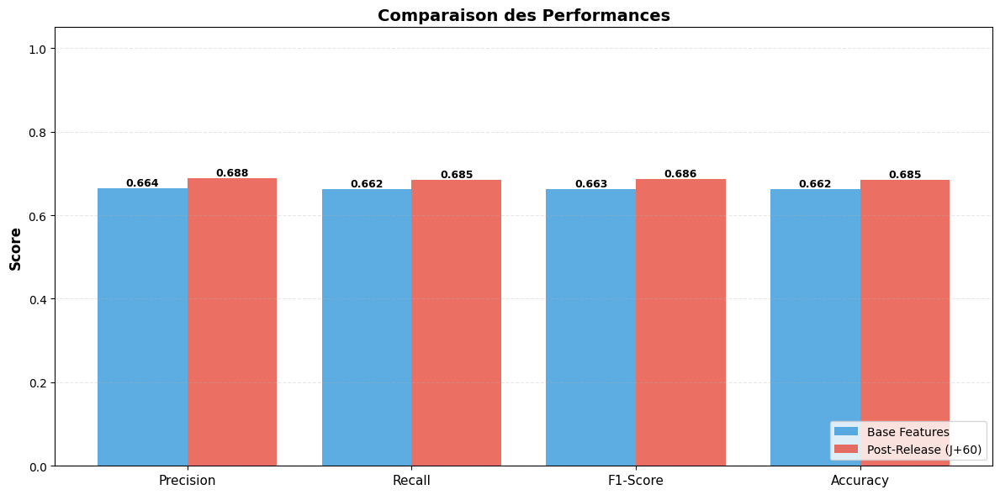

In [689]:
models_to_compare_res = [
    {"name": "Base Features", "report": classification_report_phase_1},
    {"name": "Post-Release (J+60)", "report": classification_report_phase_2_j60},
]


compare_classification_reports(models_to_compare_res)

### Phase 2.1 Ajout des features additionnels (feature engeniering)

In [690]:
# PHASE 2 : Prédiction à J+60 (avec observations précoces)
phase2_1_features_base_j60_plus = {
    **phase2_features_base_j60,
    "numeric_discrete_median": phase2_features_base_j60["numeric_discrete_median"]
    + [
        "sub_languages_count",
        "publisher_game_count",
    ],
    "boolean_cols": phase2_features_base_j60["boolean_cols"]
    + [
        "exclusif_playstation_content",  # advanced
    ],
    "categorical_cols": phase2_features_base_j60["categorical_cols"]
    + [
        "price_category",
        "visibility_category",  # Catégorie composite
        "localization_category",
        "release_month",
    ],
}

In [691]:
print_features_vertical(phase2_1_features_base_j60_plus)


FEATURES PAR CATÉGORIE

--- NUMERIC CONTINUOUS (5 features) ---
   1. base_price
   2. download_size_gb
   3. hours_main_story
   4. pssstore_stars_rating
   5. metacritic_critic_score

--- NUMERIC DISCRETE ZERO (5 features) ---
   1. voice_languages_count
   2. dlcs_count
   3. trophies_count
   4. series_count
   5. packs_deluxe_count

--- BOOLEAN COLS (18 features) ---
   1. has_local_multiplayer
   2. has_online_multiplayer
   3. has_microtransactions
   4. is_indie
   5. is_vr
   6. is_ps_exclusive
   7. is_online_only
   8. is_remaster
   9. is_opti_ps5_pro
  10. is_ps4
  11. genre_action_aventure
  12. genre_roles
  13. genre_sports
  14. genre_reflexion
  15. genre_rapide
  16. has_5pct_discount_at_30d
  17. has_10pct_discount_at_60d
  18. exclusif_playstation_content

--- CATEGORICAL COLS (8 features) ---
   1. release_season
   2. publisher_category
   3. content_category
   4. popularity_category
   5. price_category
   6. visibility_category
   7. localization_category
   


Train: 3304 (80.0%) | Test: 826 (20.0%)
Pipeline créé avec 6 groupes de transformers

Train processed : (3304, 40)
Test processed  : (826, 40)
Fitting 5 folds for each of 729 candidates, totalling 3645 fits
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=30, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n

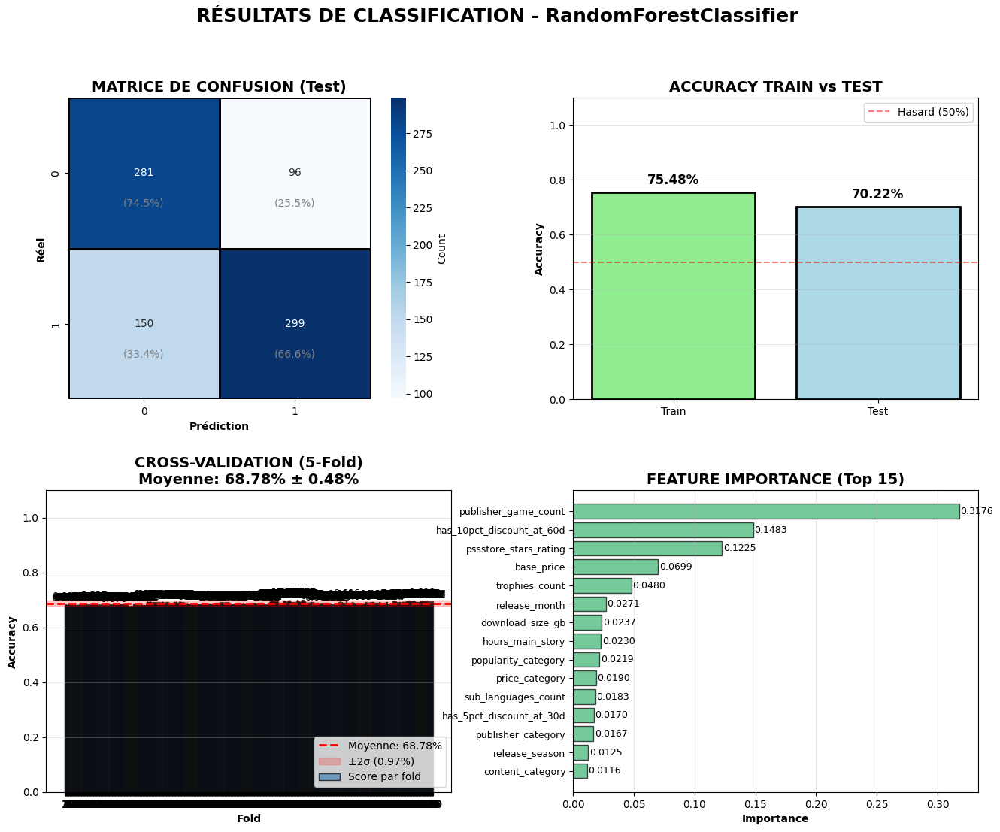

In [692]:
classification_report_phase_2_j60_plus = complete_random_forest_train(
    phase2_1_features_base_j60_plus
)


TABLEAU COMPARATIF DES MODÈLES
Métrique       Base Features       Post-Release (J+60) Engineered Features 
--------------------------------------------------------------------------------
Precision      0.664               0.688               0.709               
Recall         0.662               0.685               0.702               
F1-Score       0.663               0.686               0.703               
Accuracy       0.662               0.685               0.702               


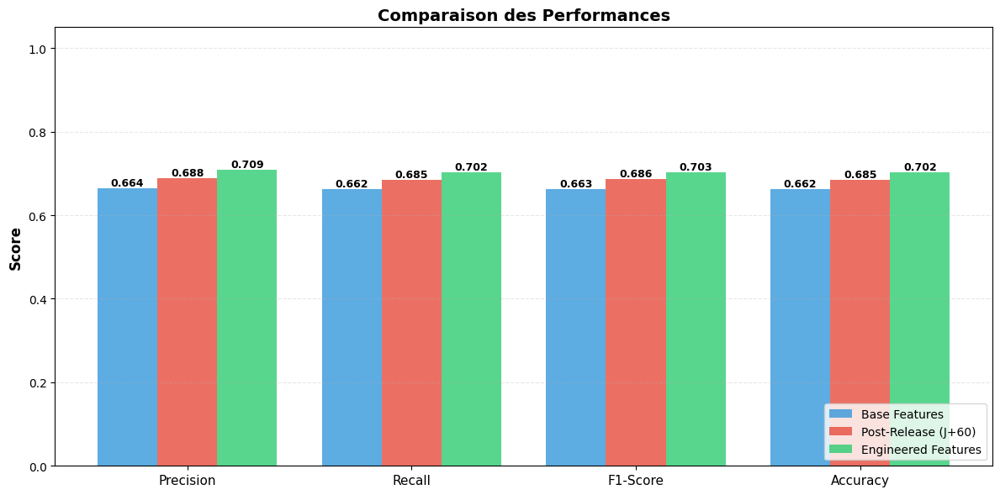

In [693]:
models_to_compare_res.append(
    {"name": "Engineered Features", "report": classification_report_phase_2_j60_plus},
)

compare_classification_reports(models_to_compare_res)

In [694]:
BEST_FEATURES_SET_RANDOM_FOREST = phase2_1_features_base_j60_plus

### Phase 3 : Vérification avec preprocess des colonnes numériques

En terme pédagogique vérifions si la transformation des colonnes numériques (scaler) as une incidence sur random forest

### Exemple sur une colonne

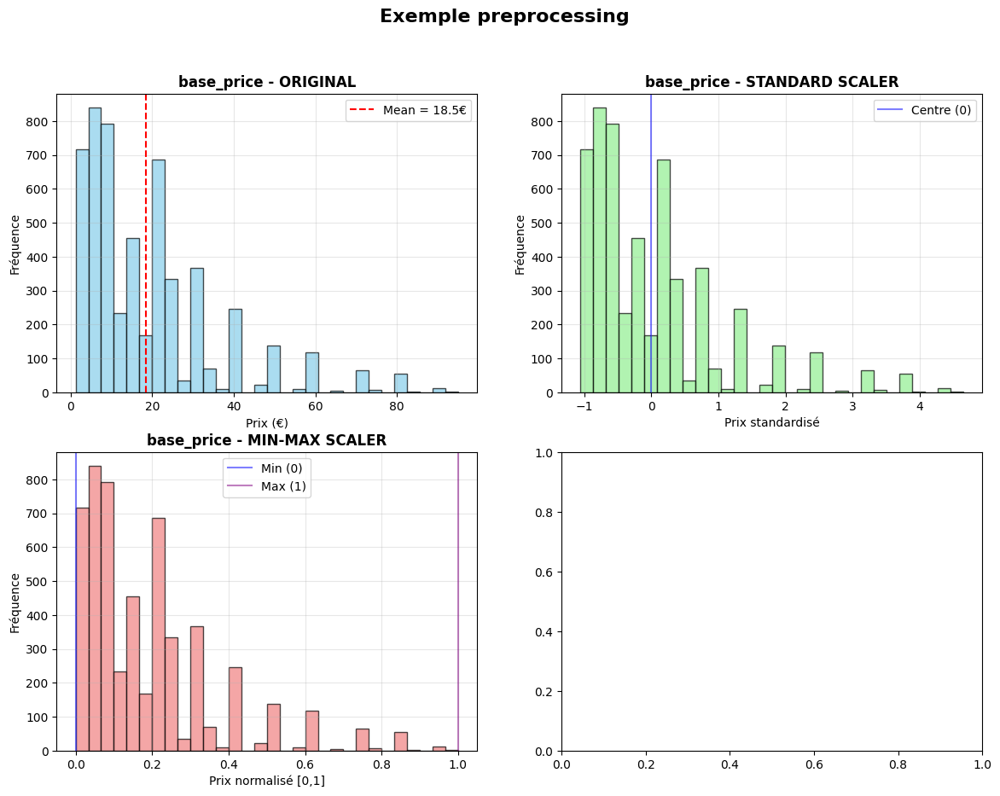

In [695]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle("Exemple preprocessing", fontsize=16, fontweight="bold")

# Colonne prix réelle
price_col = "base_price"
if price_col in df_dataset.columns:
    price_data = df_dataset[price_col].dropna()

    # Original
    ax = axes[0, 0]
    ax: plt.Axes
    ax.hist(price_data, bins=30, color="skyblue", edgecolor="black", alpha=0.7)
    ax.set_title(f"{price_col} - ORIGINAL", fontweight="bold")
    ax.set_xlabel("Prix (€)")
    ax.set_ylabel("Fréquence")
    ax.axvline(
        price_data.mean(),
        color="red",
        linestyle="--",
        label=f"Mean = {price_data.mean():.1f}€",
    )
    ax.legend()
    ax.grid(alpha=0.3)

    # StandardScaler
    scaler_std = StandardScaler()
    price_std = scaler_std.fit_transform(price_data.values.reshape(-1, 1))

    ax = axes[0, 1]
    ax: plt.Axes
    ax.hist(price_std, bins=30, color="lightgreen", edgecolor="black", alpha=0.7)
    ax.set_title(f"{price_col} - STANDARD SCALER", fontweight="bold")
    ax.set_xlabel("Prix standardisé")
    ax.set_ylabel("Fréquence")
    ax.axvline(0, color="blue", linestyle="-", alpha=0.5, label="Centre (0)")
    ax.legend()
    ax.grid(alpha=0.3)

    # MinMaxScaler
    scaler_mm = MinMaxScaler()
    price_mm = scaler_mm.fit_transform(price_data.values.reshape(-1, 1))

    ax = axes[1, 0]
    ax: plt.Axes
    ax.hist(price_mm, bins=30, color="lightcoral", edgecolor="black", alpha=0.7)
    ax.set_title(f"{price_col} - MIN-MAX SCALER", fontweight="bold")
    ax.set_xlabel("Prix normalisé [0,1]")
    ax.set_ylabel("Fréquence")
    ax.axvline(0, color="blue", linestyle="-", alpha=0.5, label="Min (0)")
    ax.axvline(1, color="purple", linestyle="-", alpha=0.5, label="Max (1)")
    ax.legend()
    ax.grid(alpha=0.3)

### Ajout Classe pipeline scikit learn pour clip les outlier (IQR)

In [696]:
class OutlierClipper(BaseEstimator, TransformerMixin):
    # Clip les outliers avec la méthode IQR
    def __init__(self):
        self.lower_bounds_ = None
        self.upper_bounds_ = None

    def fit(self, X, y=None):
        if isinstance(X, pd.DataFrame):
            X_values = X.values
        else:
            X_values = X

        Q1 = np.percentile(X_values, 25, axis=0)
        Q3 = np.percentile(X_values, 75, axis=0)
        IQR = Q3 - Q1

        self.lower_bounds_ = Q1 - 1.5 * IQR
        self.upper_bounds_ = Q3 + 1.5 * IQR

        return self

    def transform(self, X):
        if isinstance(X, pd.DataFrame):
            X_values = X.values
            X_clipped = np.clip(X_values, self.lower_bounds_, self.upper_bounds_)
            return pd.DataFrame(X_clipped, columns=X.columns, index=X.index)
        else:
            return np.clip(X, self.lower_bounds_, self.upper_bounds_)

    def get_feature_names_out(self, input_features=None):
        """Retourne les noms des features (inchangés)"""
        return input_features

In [697]:
def visualize_outlier_clipping(df: pd.DataFrame, column_name):

    values_original = df[column_name].values.reshape(-1, 1)

    clipper = OutlierClipper()
    values_clipped = clipper.fit_transform(values_original).flatten()
    values_original = values_original.flatten()

    # IQR
    Q1 = np.percentile(values_original, 25)
    Q3 = np.percentile(values_original, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identifier les outliers
    outliers_mask = (values_original < lower_bound) | (values_original > upper_bound)
    n_outliers = outliers_mask.sum()

    # Afficher les statistiques
    print("\n" + "=" * 70)
    print(f"STATISTIQUES: {column_name}")
    print("=" * 70)

    print(f"{'Métrique':<25} {'Avant Clipping':<20} {'Après Clipping':<20}")

    print("-" * 70)

    print(f"{'Min':<25} {values_original.min():<20.2f} {values_clipped.min():<20.2f}")
    print(f"{'Q1 (25%)':<25} {Q1:<20.2f} {np.percentile(values_clipped, 25):<20.2f}")
    print(
        f"{'Médiane (50%)':<25} {np.median(values_original):<20.2f} {np.median(values_clipped):<20.2f}"
    )
    print(f"{'Q3 (75%)':<25} {Q3:<20.2f} {np.percentile(values_clipped, 75):<20.2f}")
    print(f"{'Max':<25} {values_original.max():<20.2f} {values_clipped.max():<20.2f}")
    print(
        f"{'Moyenne':<25} {values_original.mean():<20.2f} {values_clipped.mean():<20.2f}"
    )
    print(
        f"{'Écart-type':<25} {values_original.std():<20.2f} {values_clipped.std():<20.2f}"
    )

    print("-" * 70)

    print(f"{'Borne inférieure (IQR)':<25} {lower_bound:<20.2f}")
    print(f"{'Borne supérieure (IQR)':<25} {upper_bound:<20.2f}")
    print(
        f"{'Outliers détectés':<25} {n_outliers:<20} ({n_outliers/len(values_original)*100:.1f}%)"
    )
    print(f"{'Valeurs clippées':<25} {outliers_mask.sum():<20}")

    print("=" * 70 + "\n")

In [698]:
visualize_outlier_clipping(
    df_dataset,
    "pssstore_stars_rating_count",
)


STATISTIQUES: pssstore_stars_rating_count
Métrique                  Avant Clipping       Après Clipping      
----------------------------------------------------------------------
Min                       0.00                 0.00                
Q1 (25%)                  31.00                31.00               
Médiane (50%)             88.00                88.00               
Q3 (75%)                  461.00               461.00              
Max                       1825682.00           1106.00             
Moyenne                   3501.79              311.27              
Écart-type                36219.88             405.45              
----------------------------------------------------------------------
Borne inférieure (IQR)    -614.00             
Borne supérieure (IQR)    1106.00             
Outliers détectés         895                  (16.6%)
Valeurs clippées          895                 



In [699]:
FEATURE_TO_USE_VERIF_PREPROCESS = phase2_1_features_base_j60_plus

In [700]:
def create_pipeline_test_transforms(
    available_columns: dict,
    scaler_type="standard",
    outlier_numeric_continuous=False,
    categorical_type="ordinal",
):

    if scaler_type == "standard":
        scaler = StandardScaler()
    elif scaler_type == "minmax":
        scaler = MinMaxScaler()
    elif scaler_type == "none":
        scaler = None
    else:
        raise ValueError(
            f"scaler_type doit être 'standard', 'minmax' ou 'none', reçu: {scaler_type}"
        )

    if categorical_type == "ordinal":
        categorical_transform = OrdinalEncoder(handle_unknown="use_encoded_value",unknown_value=-1,encoded_missing_value=-1)
        
    elif categorical_type == "onehot":
        categorical_transform = OneHotEncoder(sparse_output=False, handle_unknown="ignore")
        
    elif categorical_type == "onehot_drop_first":
        categorical_transform = OneHotEncoder(drop="first", sparse_output=False, handle_unknown="ignore")
        
    else:
        categorical_transform = OrdinalEncoder(handle_unknown="use_encoded_value",unknown_value=-1,encoded_missing_value=-1)
        

    transformers = []

    # NUMÉRIQUES CONTINUES
    filtered_numeric_continuous = available_columns.get("numeric_continuous", [])
    steps = [
        ("imputer", SimpleImputer(strategy="median")),
    ]

    if scaler is not None:
        steps.append(("scaler", scaler))

    if outlier_numeric_continuous is True:
        steps.append(("outlier_clipper", OutlierClipper()))

    numeric_continuous_transformer = Pipeline(steps=steps)

    if filtered_numeric_continuous is not None and len(filtered_numeric_continuous) > 0:
        transformers.append(
            (
                "num_continuous",
                numeric_continuous_transformer,
                filtered_numeric_continuous,
            )
        )

    # NUMERIQUES DISCRETES zéro
    numeric_discrete_zero = available_columns.get("numeric_discrete_zero", [])

    steps = [("zero_imputer", ZeroImputer())]

    if scaler is not None:
        steps.append(("scaler", scaler))

    numeric_discrete_zero_transformer = Pipeline(steps=steps)

    if numeric_discrete_zero is not None and len(numeric_discrete_zero) > 0:
        transformers.append(
            (
                "num_discrete_zero",
                numeric_discrete_zero_transformer,
                numeric_discrete_zero,
            )
        )

    # NUMERIQUES DISCRETES imputation médiane
    numeric_discrete_median = available_columns.get("numeric_discrete_median", [])

    steps = [
        ("imputer", SimpleImputer(strategy="median")),
    ]

    if scaler is not None:
        steps.append(("scaler", scaler))

    numeric_discrete_median_transformer = Pipeline(steps=steps)

    if numeric_discrete_median is not None and len(numeric_discrete_median) > 0:
        transformers.append(
            (
                "num_discrete_median",
                numeric_discrete_median_transformer,
                numeric_discrete_median,
            )
        )

    # BOOLÉENNES
    boolean_cols = available_columns.get("boolean_cols", [])
    boolean_transformer = Pipeline(
        steps=[("zero_imputer", ZeroImputer())]  # Remplacer NA par 0
    )

    if boolean_cols is not None and len(boolean_cols) > 0:
        transformers.append(("boolean", boolean_transformer, boolean_cols))

    # CATÉGORIELLES
    categorical_cols = available_columns.get("categorical_cols", [])

    steps = [
        ("imputer", SimpleImputer(strategy="constant", fill_value="unknown")),
        ("encoder", categorical_transform),
    ]

    # steps.append(("encoder", categorical_transform))
    categorical_transformer = Pipeline(steps=steps)

    if categorical_cols is not None and len(categorical_cols) > 0:
        transformers.append(("categorical", categorical_transformer, categorical_cols))

    # ORDINALES
    ordinal_cols = available_columns.get("ordinal_cols", [])

    ordinal_transformer = Pipeline(
        steps=[("imputer", SimpleImputer(strategy="median"))]
    )

    if len(ordinal_cols) > 0:
        transformers.append(("ordinal", ordinal_transformer, ordinal_cols))

    # PIPELINE FINAL
    pipeline = Pipeline(
        steps=[
            (
                "preprocessor",
                ColumnTransformer(
                    transformers=transformers,
                    remainder="drop",  # Supprimer les colonnes non spécifiées
                    verbose_feature_names_out=False,  # Garder noms courts
                ),
            )
        ]
    )

    print(f"Pipeline créé avec {len(transformers)} groupes de transformers")

    return pipeline

### Test en ajoutant scaler sur valeurs numériques

In [701]:
no_scaler_pipeline = create_pipeline_test_transforms(
    FEATURE_TO_USE_VERIF_PREPROCESS, scaler_type="none"
)
standard_scaler_pipeline = create_pipeline_test_transforms(
    FEATURE_TO_USE_VERIF_PREPROCESS, scaler_type="standard"
)
min_max_scaler_pipeline = create_pipeline_test_transforms(
    FEATURE_TO_USE_VERIF_PREPROCESS, scaler_type="minmax"
)

Pipeline créé avec 6 groupes de transformers
Pipeline créé avec 6 groupes de transformers
Pipeline créé avec 6 groupes de transformers


In [702]:
no_scaler_pipeline

,steps,"[('preprocessor', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('num_continuous', ...), ('num_discrete_zero', ...), ...]"
,remainder,'drop'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,False


In [703]:
standard_scaler_pipeline

,steps,"[('preprocessor', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('num_continuous', ...), ('num_discrete_zero', ...), ...]"
,remainder,'drop'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,False


In [704]:
min_max_scaler_pipeline

,steps,"[('preprocessor', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('num_continuous', ...), ('num_discrete_zero', ...), ...]"
,remainder,'drop'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,False



Train: 3304 (80.0%) | Test: 826 (20.0%)

Train processed : (3304, 40)
Test processed  : (826, 40)
Fitting 5 folds for each of 729 candidates, totalling 3645 fits
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=30, n_estimators=100; total time=   0.2s
[CV] END 

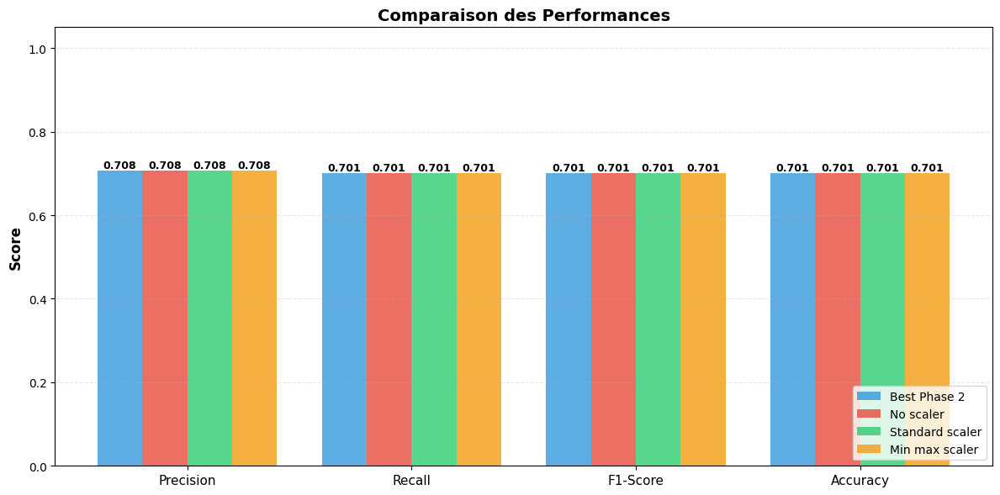

In [705]:
classification_report_noscaler = complete_random_forest_train(
    FEATURE_TO_USE_VERIF_PREPROCESS,
    pipeline_custom=standard_scaler_pipeline,
    show_plot=False,
)
classification_report_standard_scaler = complete_random_forest_train(
    FEATURE_TO_USE_VERIF_PREPROCESS,
    pipeline_custom=standard_scaler_pipeline,
    show_plot=False,
)
classification_report_min_max_scaler = complete_random_forest_train(
    FEATURE_TO_USE_VERIF_PREPROCESS,
    pipeline_custom=min_max_scaler_pipeline,
    show_plot=False,
)

models_to_compare_preprocess_res = [
    {"name": "Best Phase 2", "report": classification_report_noscaler},
    {"name": "No scaler", "report": classification_report_standard_scaler},
    {"name": "Standard scaler", "report": classification_report_standard_scaler},
    {"name": "Min max scaler", "report": classification_report_standard_scaler},
]

compare_classification_reports(models_to_compare_preprocess_res)


### Ajout transformation Outlier IQR

Pipeline créé avec 6 groupes de transformers

Train: 3304 (80.0%) | Test: 826 (20.0%)

Train processed : (3304, 40)
Test processed  : (826, 40)
Fitting 5 folds for each of 729 candidates, totalling 3645 fits
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=30, n

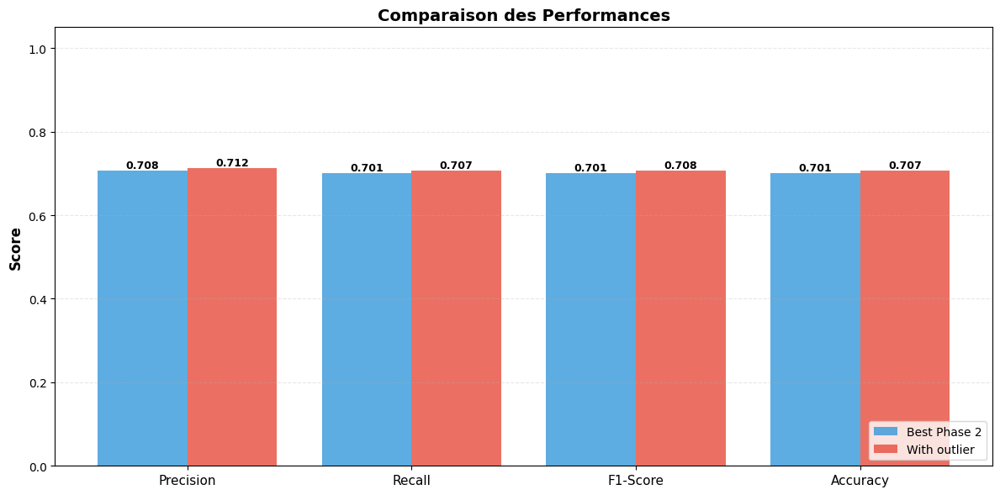

In [706]:
with_outlier_pipeline = create_pipeline_test_transforms(
    FEATURE_TO_USE_VERIF_PREPROCESS, scaler_type="none",outlier_numeric_continuous=True
)

classification_report_with_outlier = complete_random_forest_train(
    FEATURE_TO_USE_VERIF_PREPROCESS,
    pipeline_custom=with_outlier_pipeline,
    show_plot=False,
)

models_to_compare_preprocess_res = [
    {"name": "Best Phase 2", "report": classification_report_noscaler},
    {"name": "With outlier", "report": classification_report_with_outlier},
]

compare_classification_reports(models_to_compare_preprocess_res)

### Comparaison catégorielle Ordinal vs one hot

In [707]:
ordinal_pipeline = create_pipeline_test_transforms(
    FEATURE_TO_USE_VERIF_PREPROCESS, scaler_type="none",outlier_numeric_continuous=True,categorical_type="ordinal"
)
one_hot_pipeline = create_pipeline_test_transforms(
    FEATURE_TO_USE_VERIF_PREPROCESS, scaler_type="none",outlier_numeric_continuous=True,categorical_type="onehot"
)
one_hot_drop_first_pipeline = create_pipeline_test_transforms(
    FEATURE_TO_USE_VERIF_PREPROCESS, scaler_type="none",outlier_numeric_continuous=True,categorical_type="onehot_drop_first"
)

Pipeline créé avec 6 groupes de transformers
Pipeline créé avec 6 groupes de transformers
Pipeline créé avec 6 groupes de transformers


In [708]:
ordinal_pipeline

,steps,"[('preprocessor', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('num_continuous', ...), ('num_discrete_zero', ...), ...]"
,remainder,'drop'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,False


In [709]:
one_hot_pipeline

,steps,"[('preprocessor', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('num_continuous', ...), ('num_discrete_zero', ...), ...]"
,remainder,'drop'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,False


In [710]:
one_hot_drop_first_pipeline

,steps,"[('preprocessor', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('num_continuous', ...), ('num_discrete_zero', ...), ...]"
,remainder,'drop'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,False



Train: 3304 (80.0%) | Test: 826 (20.0%)

Train processed : (3304, 40)
Test processed  : (826, 40)
Fitting 5 folds for each of 729 candidates, totalling 3645 fits
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s

[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=30, n_estimators=100; total time=   0.2s
[CV] END 

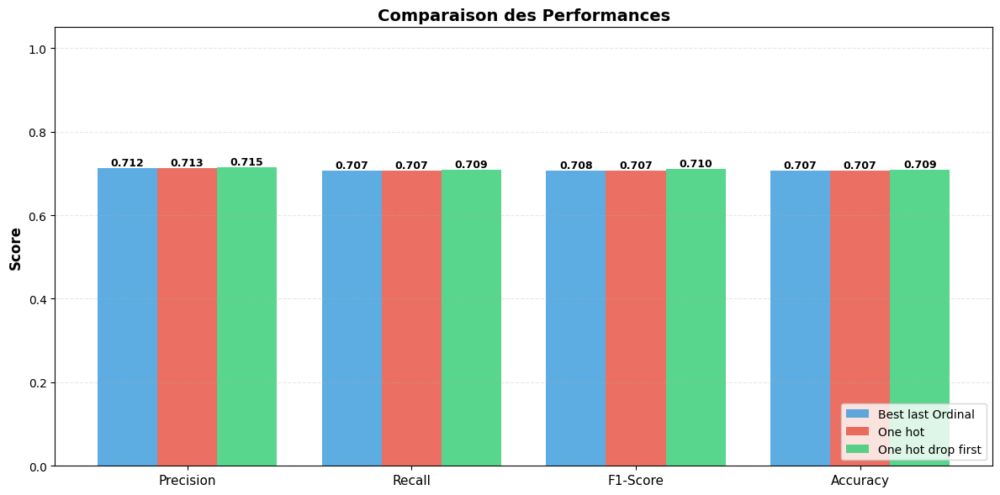

In [711]:
classification_report_ordinal = complete_random_forest_train(
    FEATURE_TO_USE_VERIF_PREPROCESS,
    pipeline_custom=ordinal_pipeline,
    show_plot=False,
)

classification_report_one_hot = complete_random_forest_train(
    FEATURE_TO_USE_VERIF_PREPROCESS,
    pipeline_custom=one_hot_pipeline,
    show_plot=False,
)

classification_report_one_hot_drop_first_pipeline = complete_random_forest_train(
    FEATURE_TO_USE_VERIF_PREPROCESS,
    pipeline_custom=one_hot_drop_first_pipeline,
    show_plot=False,
)

models_to_compare_preprocess_res = [
    {"name": "Best last Ordinal", "report": classification_report_ordinal},
    {"name": "One hot", "report": classification_report_one_hot},
    {"name": "One hot drop first", "report": classification_report_one_hot_drop_first_pipeline},
]

compare_classification_reports(models_to_compare_preprocess_res)

In [712]:
BEST_RANDOM_FOREST_CLASSIFICATION_REPORT = classification_report_ordinal

## Phase 4 : Tester et comparer Random forest avec d'autre modéles ML

Comparaison avec un modèle Boost et un Support vector machine

### Gradient boosting

In [713]:
def complete_gradient_boosting_train(features_to_use, pipeline_custom=None, show_plot=True):
    base_X_features = get_all_features_columns(features_to_use)

    # Sélectionner les colonnes disponibles
    X = df_binary_disc[base_X_features]

    # On assigne la target (n'a pas changé)
    y = df_binary_disc[TARGET_PROMO_BINNARY_COL]

    X_train, X_test, y_train, y_test = train_test_split(
        X,
        y,
        test_size=0.2,
        random_state=42,  # Meme reproductibilité pour comparer modèles
        stratify=y,
    )

    total = len(X_train) + len(X_test)
    print(
        f"\nTrain: {len(X_train)} ({len(X_train)/total*100:.1f}%) | Test: {len(X_test)} ({len(X_test)/total*100:.1f}%)"
    )

    if pipeline_custom is None:
        pipeline = create_pipeline_random_forest(available_columns=features_to_use)
    else:
        pipeline = pipeline_custom

    # Fit et transform avec le pipeline crée pour la phase 1
    X_train_processed = pipeline.fit_transform(X_train)
    X_test_processed = pipeline.transform(X_test)

    print(f"\nTrain processed : {X_train_processed.shape}")
    print(f"Test processed  : {X_test_processed.shape}")

    model = GradientBoostingClassifier(
        random_state=42,
        n_iter_no_change=10,           # Stop si pas d'amélioration pendant 10 itérations
        validation_fraction=0.1,       # Utiliser 10% pour validation interne
        tol=0.0001,                    # Tolérance pour early stopping
    )

    # param_distributions = {
    #     "n_estimators": [100, 200, 300],
    #     "learning_rate": [0.01, 0.05, 0.1, 0.2],
    #     "max_depth": [3, 5, 7],
    #     "subsample": [0.7, 0.8, 0.9, 1.0],
    #     "min_samples_split": [5, 10, 20],
    #     "min_samples_leaf": [2, 5, 10],
    # }
    
    # Hyperparamètres anti-overfitting
    param_distributions = {
        "n_estimators": [50, 100, 150, 200],         # Réduire le max
        "learning_rate": [0.01, 0.05, 0.1],          # Favoriser valeurs basses
        "max_depth": [2, 3, 4, 5],                   # RÉDUIRE (était 3-7)
        "subsample": [0.6, 0.7, 0.8],                # RÉDUIRE (était 0.7-1.0)
        "min_samples_split": [20, 30, 40, 50],       # AUGMENTER (était 5-20)
        "min_samples_leaf": [10, 15, 20],            # AUGMENTER (était 2-10)
        "max_features": ['sqrt', 'log2', 0.7, 0.8],  # AJOUTER cette contrainte
    }

    # Configuration de la validation croisée
    cv_strategy = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=42
    )  # 5-fold cross-validation

    # RandomizedSearchCV au lieu de GridSearchCV
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_distributions,
        n_iter=50,  # Nombre de combinaisons à tester (ajustable)
        scoring="accuracy",
        cv=cv_strategy,
        n_jobs=-1,
        verbose=2,
        random_state=42,
    )

    # Entraînement du modèle avec RandomizedSearchCV
    random_search.fit(X_train_processed, y_train)

    print("\nMeilleurs hyperparamètres trouvés:")
    print(random_search.best_params_)

    print(f"Meilleur score de validation: {random_search.best_score_:.2%}")

    # Entraînement du modèle avec les meilleurs hyperparamètres
    best_model = random_search.best_estimator_

    # Récupérer les scores CV du RandomizedSearchCV
    cv_scores = random_search.cv_results_["mean_test_score"]

    best_cv_score = random_search.best_score_

    print(f"Meilleur score CV: {best_cv_score:.4f}")
    print(f"Scores CV: {cv_scores}")
    print(f"Score CV moyen: {cv_scores.mean():.4f} (environ {cv_scores.std() * 2:.4f})")

    y_pred_train = best_model.predict(X_train_processed)
    y_pred_test = best_model.predict(X_test_processed)

    train_accuracy = accuracy_score(y_train, y_pred_train)
    test_accuracy = accuracy_score(y_test, y_pred_test)

    print(f"Train accuracy: {train_accuracy:.4f}")
    print(f"Test accuracy: {test_accuracy:.4f}")

    print("\nRapport de classification (Test):")
    classification_report_res = classification_report(
        y_test, y_pred_test, output_dict=True
    )
    print(classification_report(y_test, y_pred_test))

    print("\nMatrice de confusion:")
    cm = confusion_matrix(y_test, y_pred_test)
    print(cm)

    preprocessor = pipeline
    feature_names = list(preprocessor.get_feature_names_out())

    if show_plot:
        fig = plot_classification_results(
            model=best_model,
            y_train=y_train,
            y_test=y_test,
            y_train_pred=y_pred_train,
            y_test_pred=y_pred_test,
            cv_scores=cv_scores,
            feature_names=feature_names,
        )

    return classification_report_res

Pipeline créé avec 6 groupes de transformers

Train: 3304 (80.0%) | Test: 826 (20.0%)

Train processed : (3304, 40)
Test processed  : (826, 40)
Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END learning_rate=0.1, max_depth=3, max_features=log2, min_samples_leaf=15, min_samples_split=30, n_estimators=50, subsample=0.8; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=3, max_features=log2, min_samples_leaf=15, min_samples_split=30, n_estimators=50, subsample=0.8; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=3, max_features=log2, min_samples_leaf=15, min_samples_split=30, n_estimators=50, subsample=0.8; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=3, max_features=log2, min_samples_leaf=15, min_samples_split=30, n_estimators=50, subsample=0.8; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=150, subsample=0.6; total time=   0.1s
[CV] END learning_rate=

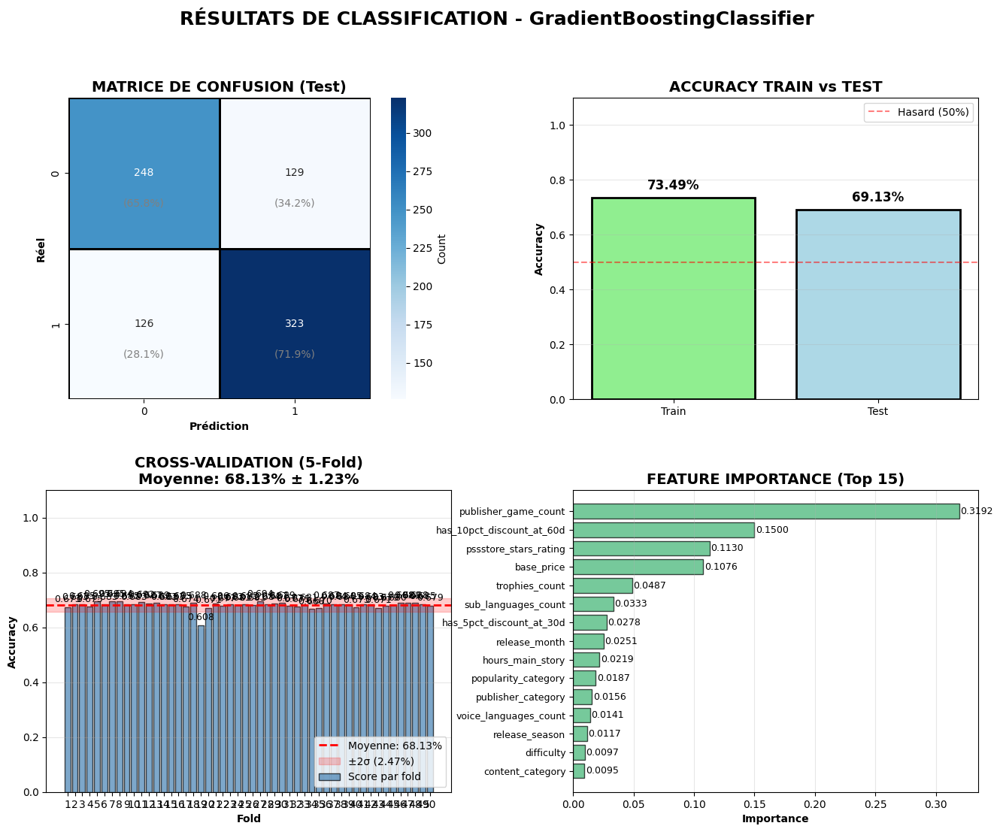

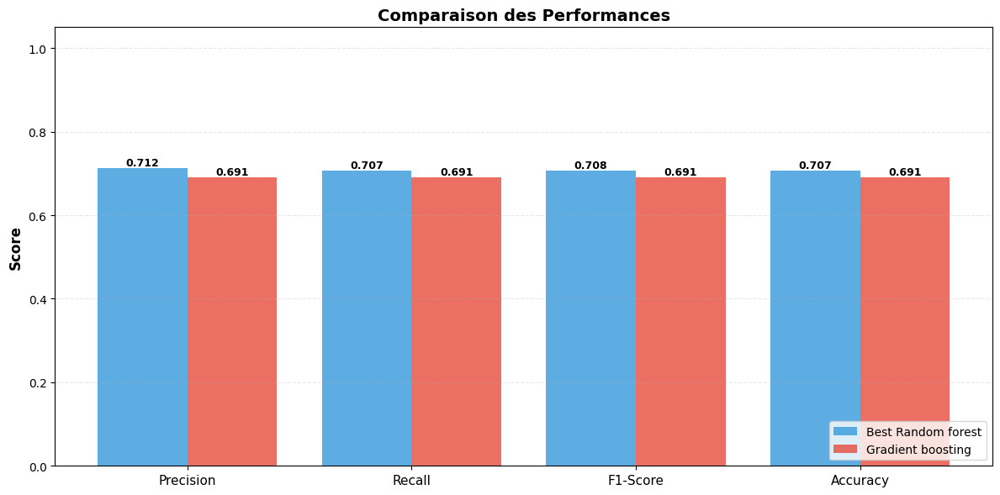

In [714]:
# Pour comparer les modèles on prend le pipeline avec les meilleures résultat random forest.
gradient_boosting_pipeline = create_pipeline_test_transforms(
    BEST_FEATURES_SET_RANDOM_FOREST, scaler_type="none",outlier_numeric_continuous=True,categorical_type="ordinal"
)

classification_report_gradient_boosting = complete_gradient_boosting_train(BEST_FEATURES_SET_RANDOM_FOREST, pipeline_custom=gradient_boosting_pipeline,show_plot=True)

models_to_compare_preprocess_res = [
    {"name": "Best Random forest", "report": BEST_RANDOM_FOREST_CLASSIFICATION_REPORT},
    {"name": "Gradient boosting", "report": classification_report_gradient_boosting},
]

compare_classification_reports(models_to_compare_preprocess_res)

### SVC 

In [715]:
def complete_svc_train(features_to_use, pipeline_custom=None, show_plot=True):
    base_X_features = get_all_features_columns(features_to_use)

    # Sélectionner les colonnes disponibles
    X = df_binary_disc[base_X_features]

    # On assigne la target (n'a pas changé)
    y = df_binary_disc[TARGET_PROMO_BINNARY_COL]

    X_train, X_test, y_train, y_test = train_test_split(
        X,
        y,
        test_size=0.2,
        random_state=42,  # Meme reproductibilité pour comparer modèles
        stratify=y,
    )

    total = len(X_train) + len(X_test)
    print(
        f"\nTrain: {len(X_train)} ({len(X_train)/total*100:.1f}%) | Test: {len(X_test)} ({len(X_test)/total*100:.1f}%)"
    )

    if pipeline_custom is None:
        pipeline = create_pipeline_random_forest(available_columns=features_to_use)
    else:
        pipeline = pipeline_custom

    # Fit et transform avec le pipeline crée pour la phase 1
    X_train_processed = pipeline.fit_transform(X_train)
    X_test_processed = pipeline.transform(X_test)

    print(f"\nTrain processed : {X_train_processed.shape}")
    print(f"Test processed  : {X_test_processed.shape}")

    model = SVC(
        kernel='rbf',
        class_weight='balanced',
        random_state=42,
        probability=True  # Important pour certaines métriques
    )

    param_distributions = {
        "C": [0.1, 1.0, 10.0, 100.0],
        "gamma": ['scale', 'auto', 0.001, 0.01, 0.1],
    }

    # Configuration de la validation croisée
    cv_strategy = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=42
    )  # 5-fold cross-validation

    # RandomizedSearchCV
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_distributions,
        n_iter=20,  # Réduit car SVC est lent (5 C × 5 gamma = 25 combinaisons max)
        scoring="accuracy",
        cv=cv_strategy,
        n_jobs=-1,
        verbose=2,
        random_state=42,
    )

    # Entraînement du modèle avec RandomizedSearchCV
    print("\nSVC peut être lent...")
    random_search.fit(X_train_processed, y_train)

    print("\nMeilleurs hyperparamètres trouvés:")
    print(random_search.best_params_)

    print(f"Meilleur score de validation: {random_search.best_score_:.2%}")

    # Entraînement du modèle avec les meilleurs hyperparamètres
    best_model = random_search.best_estimator_

    # Récupérer les scores CV du RandomizedSearchCV
    cv_scores = random_search.cv_results_["mean_test_score"]

    best_cv_score = random_search.best_score_

    print(f"Meilleur score CV: {best_cv_score:.4f}")
    print(f"Scores CV: {cv_scores}")
    print(f"Score CV moyen: {cv_scores.mean():.4f} (environ {cv_scores.std() * 2:.4f})")

    y_pred_train = best_model.predict(X_train_processed)
    y_pred_test = best_model.predict(X_test_processed)

    train_accuracy = accuracy_score(y_train, y_pred_train)
    test_accuracy = accuracy_score(y_test, y_pred_test)

    print(f"Train accuracy: {train_accuracy:.4f}")
    print(f"Test accuracy: {test_accuracy:.4f}")

    print("\nRapport de classification (Test):")
    classification_report_res = classification_report(
        y_test, y_pred_test, output_dict=True
    )
    print(classification_report(y_test, y_pred_test))

    print("\nMatrice de confusion:")
    cm = confusion_matrix(y_test, y_pred_test)
    print(cm)

    preprocessor = pipeline
    feature_names = list(preprocessor.get_feature_names_out())

    if show_plot:
        fig = plot_classification_results(
            model=best_model,
            y_train=y_train,
            y_test=y_test,
            y_train_pred=y_pred_train,
            y_test_pred=y_pred_test,
            cv_scores=cv_scores,
            feature_names=feature_names,
        )

    return classification_report_res

Pipeline créé avec 6 groupes de transformers

Train: 3304 (80.0%) | Test: 826 (20.0%)

Train processed : (3304, 71)
Test processed  : (826, 71)

SVC peut être lent...
Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] END ..................................C=0.1, gamma=auto; total time=   2.3s
[CV] END .................................C=0.1, gamma=scale; total time=   2.4s
[CV] END ..................................C=0.1, gamma=0.01; total time=   2.4s
[CV] END .................................C=0.1, gamma=0.001; total time=   2.5s
[CV] END ..................................C=0.1, gamma=auto; total time=   2.5s[CV] END .................................C=0.1, gamma=0.001; total time=   2.5s

[CV] END ..................................C=0.1, gamma=auto; total time=   2.5s
[CV] END .................................C=0.1, gamma=scale; total time=   2.5s[CV] END .................................C=0.1, gamma=scale; total time=   2.5s

[CV] END .................................

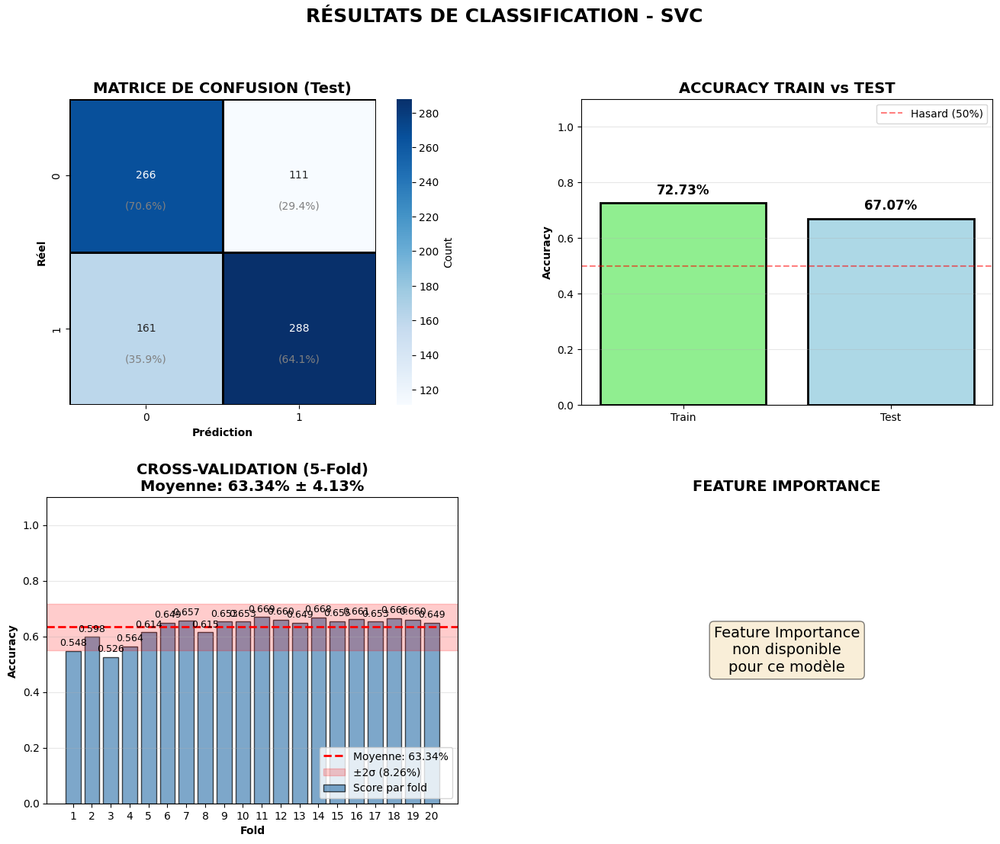

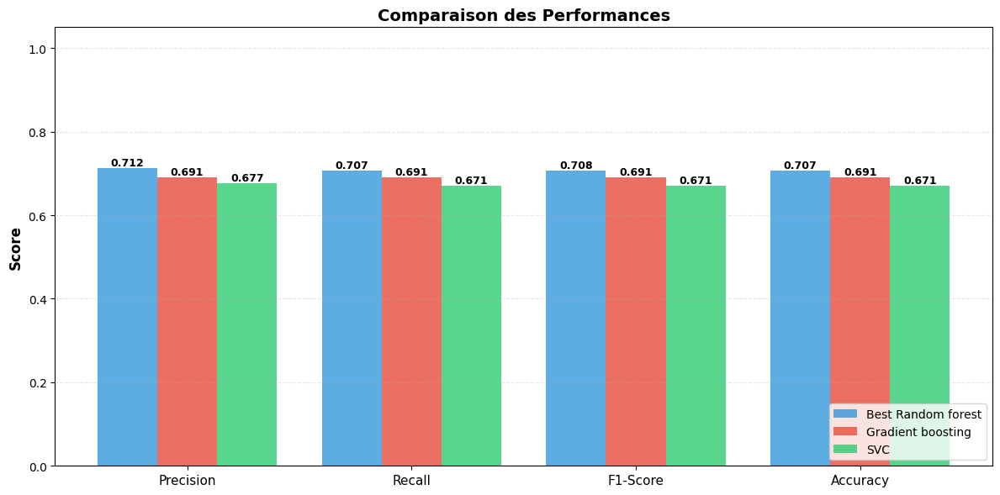

In [716]:
# Après recherche on ajuste le pipeline pour mieux s'adapter à la logique de l'algo (minmax scaler et one hot encoding)

svc_pipeline = create_pipeline_test_transforms(
    BEST_FEATURES_SET_RANDOM_FOREST, scaler_type="minmax",outlier_numeric_continuous=True,categorical_type="onehot_drop_first"
)

classification_report_svc = complete_svc_train(BEST_FEATURES_SET_RANDOM_FOREST, pipeline_custom=svc_pipeline,show_plot=True)

models_to_compare_preprocess_res = [
    {"name": "Best Random forest", "report": BEST_RANDOM_FOREST_CLASSIFICATION_REPORT},
    {"name": "Gradient boosting", "report": classification_report_gradient_boosting},
    {"name": "SVC", "report": classification_report_svc},
]

compare_classification_reports(models_to_compare_preprocess_res)

## Phase 5 Tester d'autres target de prédictions

### Variante classification binaire discount price

- has_75_percent_discount_before_3_year

In [717]:
TARGET_PROMO_BINNARY_COL_75 = "has_75_percent_discount_before_3_year"

In [718]:
df_binary_disc_variant_75 = df_dataset.copy()

In [719]:
# On supprime les lignes (jeux récent n'ayant jamais ateind la promotion)
df_binary_disc_variant = df_binary_disc_variant_75.dropna(subset=[TARGET_PROMO_BINNARY_COL_75])

print(df_binary_disc_variant_75[TARGET_PROMO_BINNARY_COL_75].value_counts())

print(f"Avant: {len(df_dataset)} lignes")
print(f"Après: {len(df_binary_disc_variant_75)} lignes")

has_75_percent_discount_before_3_year
1.0    964
0.0    799
Name: count, dtype: int64
Avant: 5382 lignes
Après: 5382 lignes


In [720]:
base_X_features = get_all_features_columns(BEST_FEATURES_SET_RANDOM_FOREST)

# Sélectionner les colonnes disponibles
X_75 = df_binary_disc_variant[base_X_features]

# On assigne la target
y_75 = df_binary_disc_variant[TARGET_PROMO_BINNARY_COL_75]

Pipeline créé avec 6 groupes de transformers

Train: 1410 (80.0%) | Test: 353 (20.0%)

Train processed : (1410, 40)
Test processed  : (353, 40)
Fitting 5 folds for each of 729 candidates, totalling 3645 fits
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.1s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.1s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.1s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.1s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.1s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=30, n

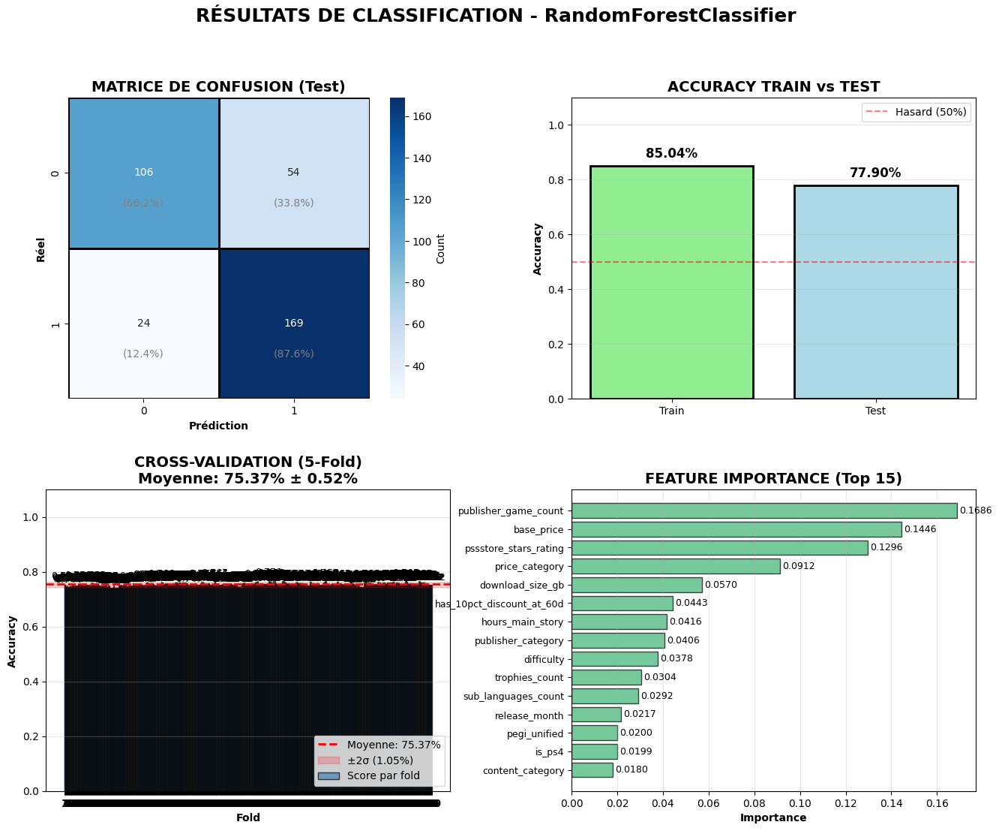

In [721]:
# On prend le pipeline avec les meilleures résultat random forest première phase.
r_pipeline = create_pipeline_test_transforms(
    BEST_FEATURES_SET_RANDOM_FOREST, scaler_type="none",outlier_numeric_continuous=True,categorical_type="ordinal"
)

classification_report_ordinal = complete_random_forest_train(
    BEST_FEATURES_SET_RANDOM_FOREST,
    pipeline_custom=r_pipeline,
    show_plot=True,
    custom_X=X_75,
    custom_y=y_75
)

- has_33_percent_discount_before_0.6_year

In [722]:
TARGET_PROMO_BINNARY_COL_33 = "has_33_percent_discount_before_0.6_year"

In [723]:
df_binary_disc_variant_33 = df_dataset.copy()

In [724]:
# On supprime les lignes (jeux récent n'ayant jamais ateind la promotion)
df_binary_disc_variant_33 = df_binary_disc_variant_33.dropna(subset=[TARGET_PROMO_BINNARY_COL_33])

print(df_binary_disc_variant_33[TARGET_PROMO_BINNARY_COL_33].value_counts())

print(f"Avant: {len(df_dataset)} lignes")
print(f"Après: {len(df_binary_disc_variant_33)} lignes")

has_33_percent_discount_before_0.6_year
1.0    2418
0.0    2291
Name: count, dtype: int64
Avant: 5382 lignes
Après: 4709 lignes


In [725]:
base_X_features = get_all_features_columns(BEST_FEATURES_SET_RANDOM_FOREST)

# Sélectionner les colonnes disponibles
X_33 = df_binary_disc_variant_33[base_X_features]

# On assigne la target
y_33 = df_binary_disc_variant_33[TARGET_PROMO_BINNARY_COL_33]

Pipeline créé avec 6 groupes de transformers

Train: 3767 (80.0%) | Test: 942 (20.0%)

Train processed : (3767, 40)
Test processed  : (942, 40)
Fitting 5 folds for each of 729 candidates, totalling 3645 fits
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=30, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n

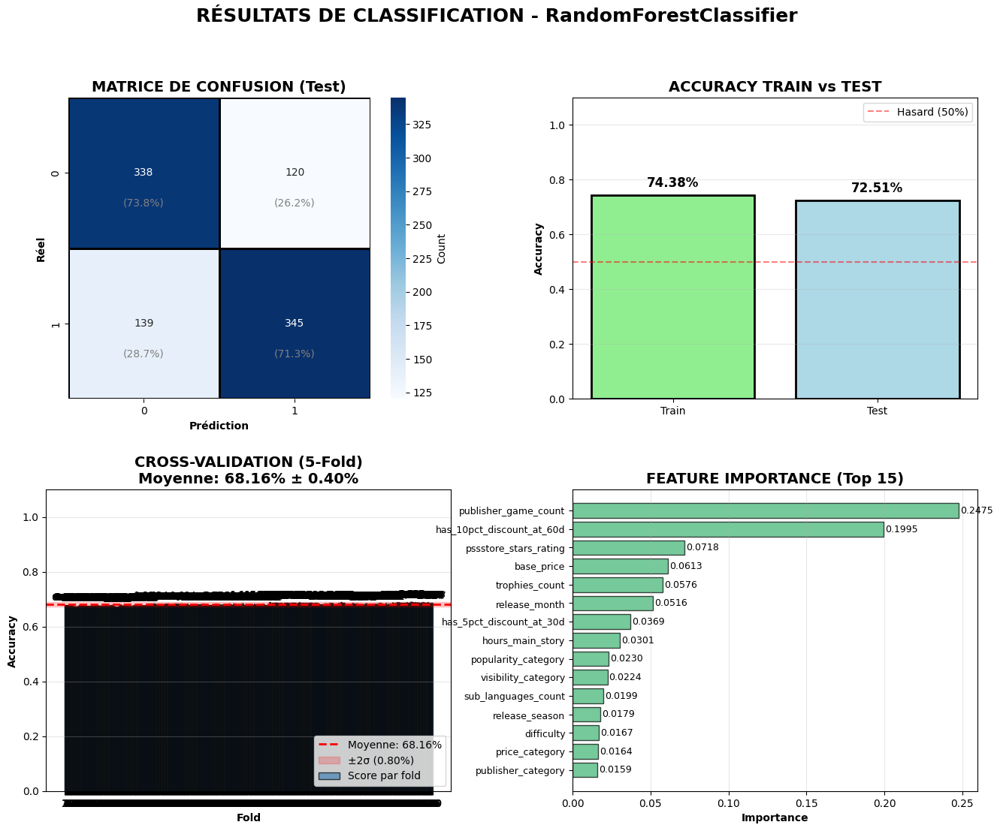

In [726]:
# On prend le pipeline avec les meilleures résultat random forest première phase.
r_pipeline = create_pipeline_test_transforms(
    BEST_FEATURES_SET_RANDOM_FOREST, scaler_type="none",outlier_numeric_continuous=True,categorical_type="ordinal"
)

classification_report_ordinal = complete_random_forest_train(
    BEST_FEATURES_SET_RANDOM_FOREST,
    pipeline_custom=r_pipeline,
    show_plot=True,
    custom_X=X_33,
    custom_y=y_33
)

## Prédictions Classification multiple

**Prédiction des classes de délais depuis la date de sortie avant réduction**

- days_to_33_percent_discount_category

In [728]:
df_classe_multi_33 = df_dataset.copy()

In [729]:
TARGET_PROMO_COL_33 = 'days_to_33_percent_discount_category'
RECENT_GAMES_NO_DISCOUNT_CAT = 'moins_de_2_ans_sans_baisse'

In [730]:
# On supprime les lignes (jeux récent n'ayant jamais ateind la promotion)
df_classe_multi_33 = df_classe_multi_33[df_classe_multi_33[TARGET_PROMO_COL_33] != RECENT_GAMES_NO_DISCOUNT_CAT]

print(df_classe_multi_33[TARGET_PROMO_COL_33].value_counts())

print(f"Avant: {len(df_dataset)} lignes")
print(f"Après: {len(df_classe_multi_33)} lignes")

days_to_33_percent_discount_category
6-12_mois         1244
3-6_mois          1145
0-3_mois           854
1-2_ans            414
jamais_ou_plus     358
Name: count, dtype: int64
Avant: 5382 lignes
Après: 4015 lignes


In [732]:
def plot_class_distribution(df:pd.DataFrame, target_column):
    # Compter les occurrences
    class_counts = df[target_column].value_counts()
    
    # Ordre logique des classes (si applicable)
    class_order = [
        '0-3_mois',
        '3-6_mois', 
        '6-12_mois',
        '1-2_ans',
        'jamais_ou_plus',
    ]
    
    # Réordonner si toutes les classes sont présentes
    if all(c in class_counts.index for c in class_order):
        class_counts = class_counts.reindex(class_order)
    
    # Calculer les pourcentages
    total = class_counts.sum()
    percentages = (class_counts / total * 100).round(1)
    
    # Créer le graphique
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Couleurs dégradées
    colors = ['#2ecc71', '#3498db', '#9b59b6', '#e74c3c', '#e67e22', '#95a5a6']
    
    # Barplot horizontal
    bars = ax.barh(range(len(class_counts)), class_counts.values, 
                   color=colors[:len(class_counts)], alpha=0.8, edgecolor='black')
    
    # Ajouter les valeurs sur les barres
    for i, (count, pct) in enumerate(zip(class_counts.values, percentages.values)):
        ax.text(count + 20, i, f'{count} ({pct}%)', 
                va='center', fontsize=11, fontweight='bold')
    
    # Personnalisation
    ax.set_yticks(range(len(class_counts)))
    ax.set_yticklabels(class_counts.index, fontsize=11)
    ax.set_xlabel('Nombre de jeux', fontsize=12, fontweight='bold')
    ax.set_title(f'Distribution des Classes - {target_column}', 
                 fontsize=14, fontweight='bold')
    ax.grid(axis='x', alpha=0.3, linestyle='--')
    
    plt.tight_layout()

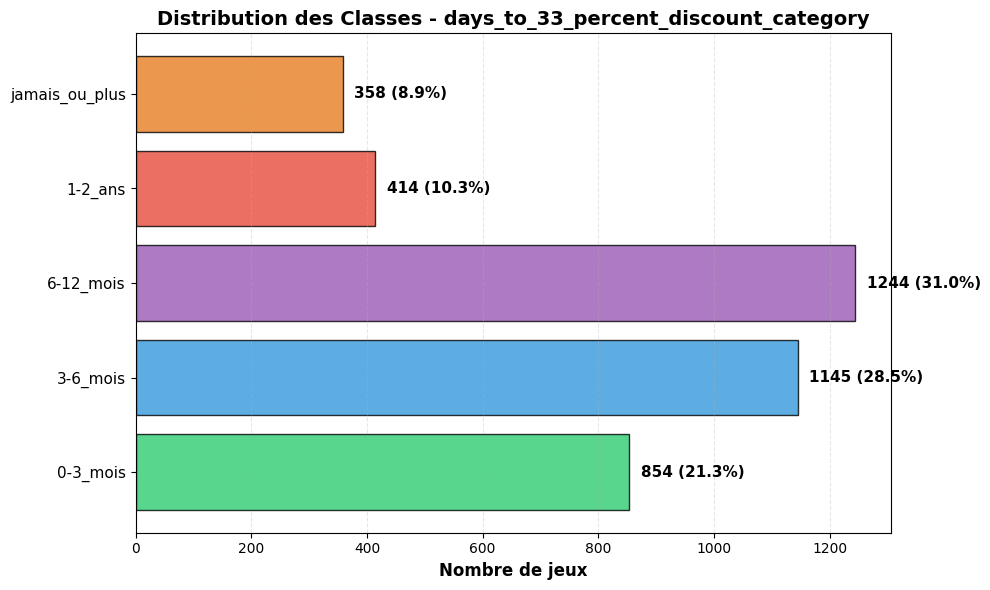

In [733]:
plot_class_distribution(df_classe_multi_33, TARGET_PROMO_COL_33)

In [734]:
base_X_features = get_all_features_columns(BEST_FEATURES_SET_RANDOM_FOREST)

# Sélectionner colonnes disponibles
X_multi_33 = df_classe_multi_33[base_X_features]

# On assigne la target
y_multi_33 = df_classe_multi_33[TARGET_PROMO_COL_33]

In [735]:
# Encoder les catégories de la target en nombres
le = LabelEncoder()
y_multi_33 = le.fit_transform(y_multi_33)

Métrique entrainement grid : f1_weighted, Pondère par le nombre d'exemples par classe (intéressant si déséquilibre)

Pipeline créé avec 6 groupes de transformers

Train: 3212 (80.0%) | Test: 803 (20.0%)

Train processed : (3212, 40)
Test processed  : (803, 40)
Fitting 5 folds for each of 729 candidates, totalling 3645 fits
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=30, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n

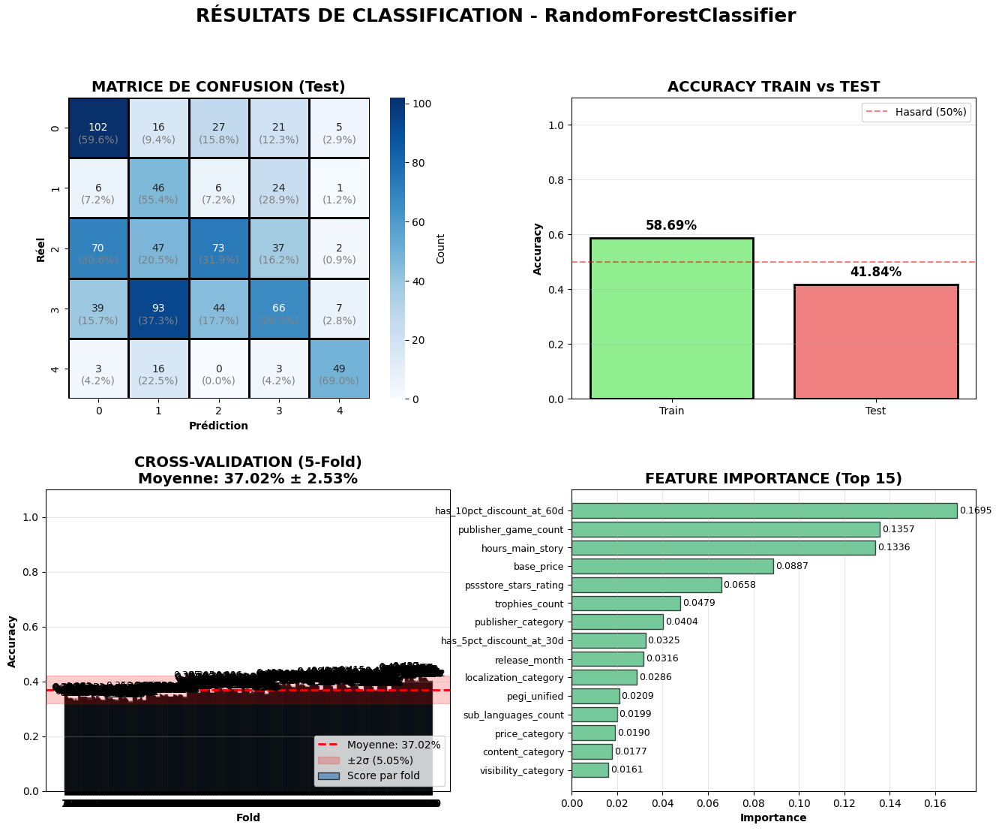

In [738]:
# On prend le pipeline avec les meilleures résultat random forest première phase.
r_pipeline = create_pipeline_test_transforms(
    BEST_FEATURES_SET_RANDOM_FOREST, scaler_type="none",outlier_numeric_continuous=True,categorical_type="ordinal"
)

classification_report_ordinal = complete_random_forest_train(
    BEST_FEATURES_SET_RANDOM_FOREST,
    pipeline_custom=r_pipeline,
    show_plot=True,
    custom_X=X_multi_33,
    custom_y=y_multi_33,
    eval_score="f1_weighted"
)

### days_to_50_percent_discount_category

In [739]:
df_classe_multi_50 = df_dataset.copy()

In [740]:
TARGET_PROMO_COL_50 = 'days_to_50_percent_discount_category'
RECENT_GAMES_NO_DISCOUNT_CAT = 'moins_de_2_ans_sans_baisse'

In [741]:
# On supprime les lignes (jeux récent n'ayant jamais ateind la promotion)
df_classe_multi_50 = df_classe_multi_50[df_classe_multi_50[TARGET_PROMO_COL_50] != RECENT_GAMES_NO_DISCOUNT_CAT]

print(df_classe_multi_50[TARGET_PROMO_COL_50].value_counts())

print(f"Avant: {len(df_dataset)} lignes")
print(f"Après: {len(df_classe_multi_50)} lignes")

days_to_50_percent_discount_category
6-12_mois         1216
1-2_ans            702
3-6_mois           592
jamais_ou_plus     576
0-3_mois           449
Name: count, dtype: int64
Avant: 5382 lignes
Après: 3535 lignes


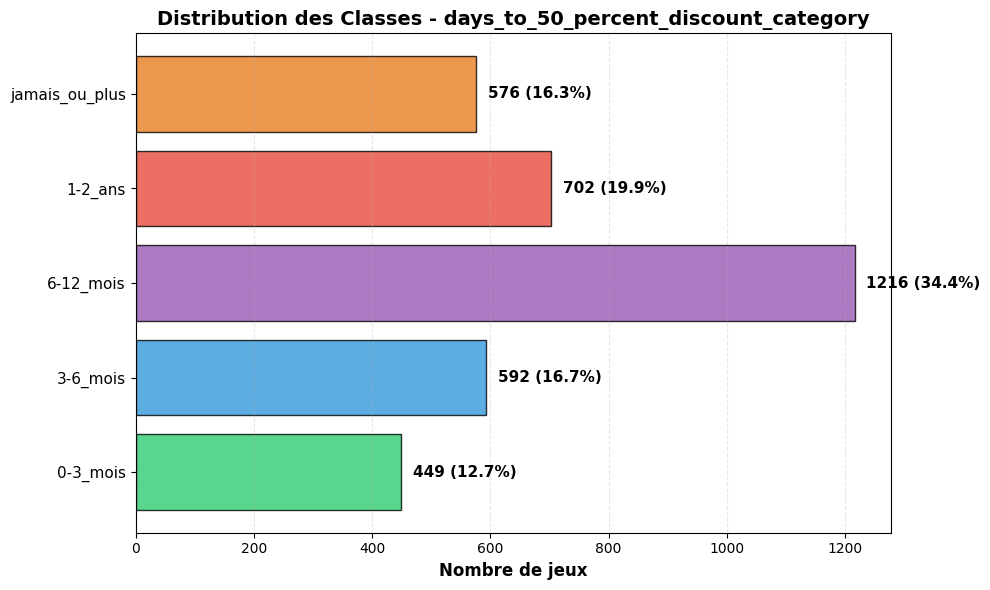

In [742]:
plot_class_distribution(df_classe_multi_50, TARGET_PROMO_COL_50)

In [743]:
base_X_features = get_all_features_columns(BEST_FEATURES_SET_RANDOM_FOREST)

# Sélectionner colonnes disponibles
X_multi_50 = df_classe_multi_50[base_X_features]

# On assigne la target
y_multi_50 = df_classe_multi_50[TARGET_PROMO_COL_50]

In [744]:
# Encoder les catégories de la target en nombres
le = LabelEncoder()
y_multi_50 = le.fit_transform(y_multi_50)

Pipeline créé avec 6 groupes de transformers

Train: 2828 (80.0%) | Test: 707 (20.0%)

Train processed : (2828, 40)
Test processed  : (707, 40)
Fitting 5 folds for each of 729 candidates, totalling 3645 fits
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n_estimators=150; total time=   0.3s
[CV] END max_depth=6, max_features=sqrt, max_samples=0.7, min_samples_leaf=10, min_samples_split=20, n

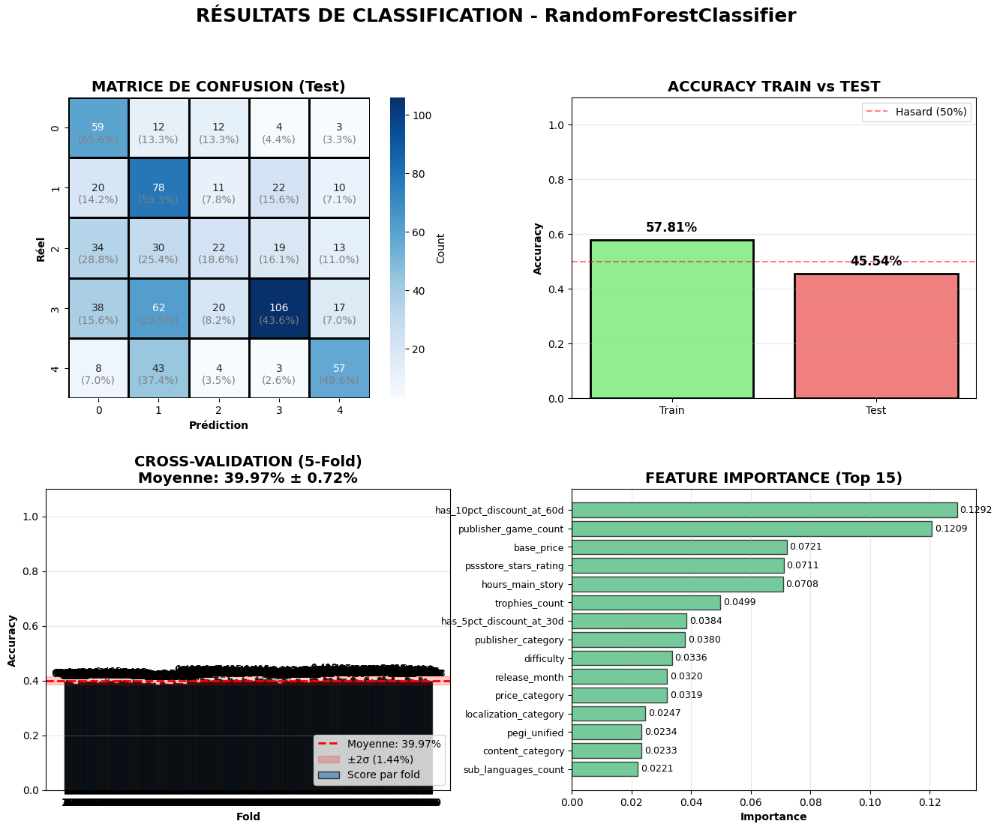

In [745]:
# On prend le pipeline avec les meilleures résultat random forest première phase.
r_pipeline = create_pipeline_test_transforms(
    BEST_FEATURES_SET_RANDOM_FOREST, scaler_type="none",outlier_numeric_continuous=True,categorical_type="ordinal"
)

classification_report_ordinal = complete_random_forest_train(
    BEST_FEATURES_SET_RANDOM_FOREST,
    pipeline_custom=r_pipeline,
    show_plot=True,
    custom_X=X_multi_50,
    custom_y=y_multi_50,
    eval_score="f1_weighted"
)

### Prédictions Régression

Nombre de jour avant d'ateindre un seuil de promotion

In [746]:
df_clean_regression_50 = df_dataset.copy()

In [747]:
TARGET_PROMO_COL_REG_50 = 'days_to_50_percent_discount'

In [748]:
# On supprime les lignes qui n'ont pas de target
df_clean_regression_50 = df_clean_regression_50[df_clean_regression_50[TARGET_PROMO_COL_REG_50].notna()].copy()

print(f"Avant: {len(df_dataset)} lignes")
print(f"Après: {len(df_clean_regression_50)} lignes")

Avant: 5382 lignes
Après: 3091 lignes


In [749]:
base_X_features = get_all_features_columns(BEST_FEATURES_SET_RANDOM_FOREST)

# Sélectionner colonnes disponibles
X = df_clean_regression_50[base_X_features]

# On assigne la target
y = df_clean_regression_50[TARGET_PROMO_COL_REG_50]

In [750]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"\nTrain : {len(X_train)} | Test : {len(X_test)}")


Train : 2472 | Test : 619


In [751]:
# On crée un pipeline adapté pour un modèle régression linéaire
r_pipeline = create_pipeline_test_transforms(
    BEST_FEATURES_SET_RANDOM_FOREST, scaler_type="standard",outlier_numeric_continuous=True,categorical_type="onehot_drop_first"
)

Pipeline créé avec 6 groupes de transformers


In [758]:
r_pipeline

,steps,"[('preprocessor', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('num_continuous', ...), ('num_discrete_zero', ...), ...]"
,remainder,'drop'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,False


#### Métriques d'évaluation

- MAE - Mean Absolute Error (moyenne des erreurs des résidus)
- R2 - Coefficient de détermination ("J'explique X% de la variance")
- RMSE - Root Mean Squared Error (pénalise gros écarts)

In [755]:
rf = LinearRegression()

# Fit et transform avec le pipeline crée pour la phase 1
X_train_processed = r_pipeline.fit_transform(X_train)
X_test_processed = r_pipeline.transform(X_test)

rf.fit(X_train_processed, y_train)

predictions = rf.predict(X_test_processed)


mae = mean_absolute_error(y_test, predictions)
r2 = r2_score(y_test, predictions)
rmse = root_mean_squared_error(y_test, predictions)

print(f"\nLinear regression RÉSULTATS:")
print(f"   MAE : {mae:.2f} jours")
print(f"   R2  : {r2:.4f}")
print(f"   RMSE  : {rmse:.2f} jours")


Linear regression RÉSULTATS:
   MAE : 142.98 jours
   R2  : 0.1571
   RMSE  : 193.44 jours


In [756]:
def show_regression_result(y_test,predictions):
    errors = y_test - predictions
    fig, (ax1,ax2,ax22,ax3) = plt.subplots(4, 1, figsize=(14, 12))
    ax1: plt.Axes
    ax2: plt.Axes
    ax22: plt.Axes
    ax3: plt.Axes

    ax1.hist(errors, bins=50, edgecolor='black')
    ax1.set_xlabel('Erreur (jours)')
    ax1.set_ylabel('Fréquence')
    ax1.set_title('Distribution des erreurs')

    ax2.scatter(y_test, predictions, alpha=0.5)
    ax2.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    ax2.set_xlabel('Valeur réelle')
    ax2.set_ylabel('Valeur prédite')
    ax2.set_title('Réel vs Prédit')

    ax22.scatter(y_test, predictions, alpha=0.5)
    ax22.plot([0, 400], [0, 400], 'r--')  # Ligne de référence ajustée
    ax22.set_xlabel('Valeur réelle')
    ax22.set_ylabel('Valeur prédite')
    ax22.set_title('Réel vs Prédit Zoom')
    ax22.set_xlim(0, 400)
    ax22.set_ylim(0, 400)

    ax3.scatter(predictions, errors, alpha=0.5)
    ax3.axhline(0, color='red', linestyle='--')
    ax3.set_xlabel('Valeur prédite')
    ax3.set_ylabel('Erreur')
    ax3.set_title('Résidus')

    plt.tight_layout()

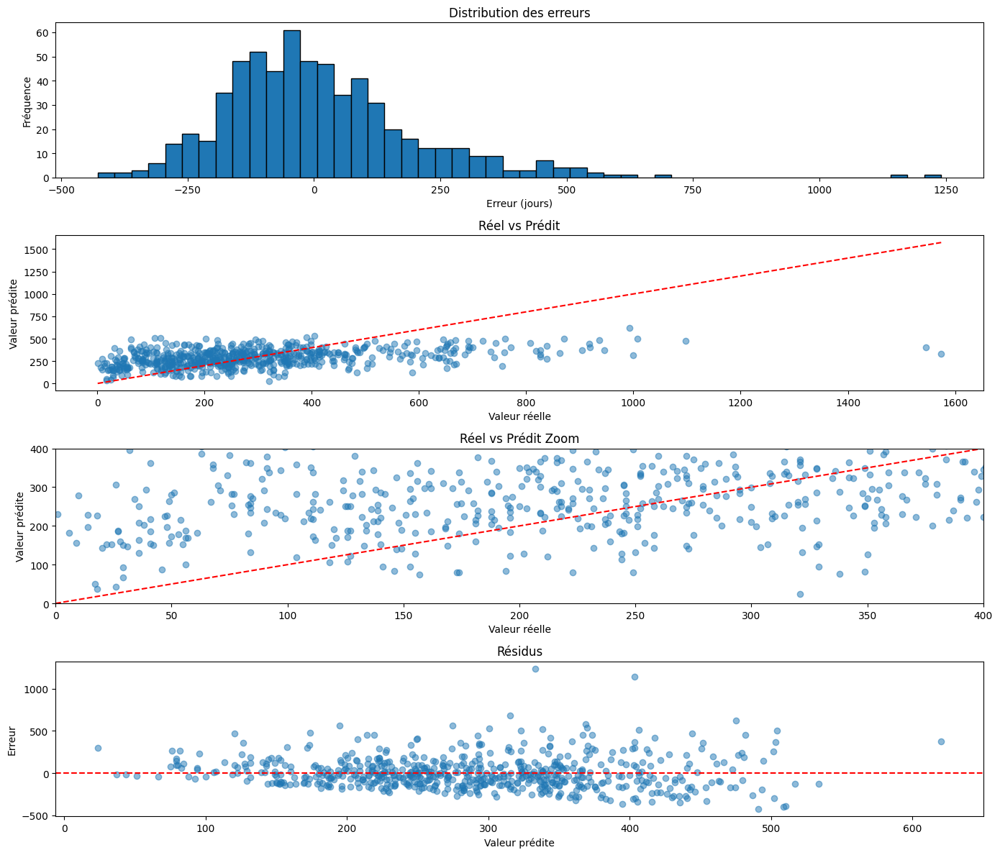

In [757]:
show_regression_result(y_test, predictions)

### Test avec un autre modèle Random forest (idem phase 1)

In [759]:
# On crée un pipeline adapté pour un modèle random forest
r_pipeline = create_pipeline_test_transforms(
    BEST_FEATURES_SET_RANDOM_FOREST, scaler_type="none",outlier_numeric_continuous=True,categorical_type="ordinal"
)

# Fit et transform avec le pipeline crée pour la phase 1
X_train_processed = r_pipeline.fit_transform(X_train)
X_test_processed = r_pipeline.transform(X_test)

rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)

rf.fit(X_train_processed, y_train)

predictions = rf.predict(X_test_processed)

mae = mean_absolute_error(y_test, predictions)
r2 = r2_score(y_test, predictions)
rmse = root_mean_squared_error(y_test, predictions)

print(f"\nRandomForestRegressor:")
print(f"   MAE : {mae:.2f} jours")
print(f"   R2  : {r2:.4f}")
print(f"   RMSE  : {rmse:.2f} jours")

Pipeline créé avec 6 groupes de transformers

RandomForestRegressor:
   MAE : 137.09 jours
   R2  : 0.2076
   RMSE  : 187.56 jours


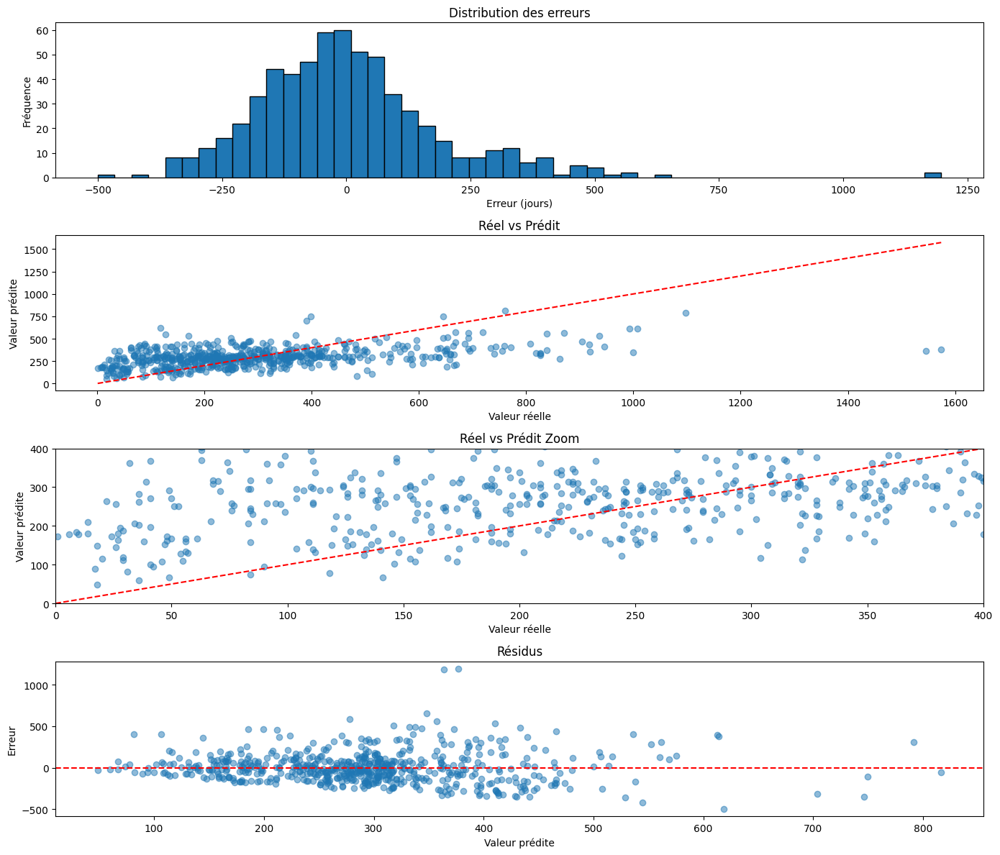

In [760]:
show_regression_result(y_test, predictions)

## Conclusion

### Dans les première phases sur notre target à prédire principal 

les résultats se sont améliorés au fur et à mesure des expérimentations.

`0.662 < 0.685 < 0.702 < 0.709`

#### Le modèle binaire obtient des performance acceptable 

(20% meilleure que le hasard aléatoire) mais pour le domaine visé (le jv n'est pas critique comme la santé), la prédiction pourra apporter une indication sommes toute intéressante aux joueurs.

#### Exemple d'interface:

The Last of Us Part II Remastered - 70€

Prédiction du modèle : "Réduction -50% probable avant 1 an (confiance: 85%)"

Recommandation :
- Attendre 6-12 mois
- Prix attendu : ~35€
- Économie potentielle : 35€ (-50%)

### Le test de deux modèles (gradient boosting et SVC) 

N'a pas amélioré les performances mais a confirmé les résultats (avec moins d'overfitting train set).

### L'expérimentation de différentes target à prédire en phase 5

Apporte également des données intéressantes. Combiner les résultats pour améliorer les prédictions.

**Multi-classe** : Accuracy globale : 46% (325 prédictions correctes sur 707)

#### Utilisable pour :

- Identifier les jeux "premium" à prix stable (Classe 3 : 69% precision)
- Détecter les réductions rapides (Classe 0 : 66% recall)

#### Non utilisable pour :

- Prédire précisément la fenêtre 6-12 mois (19% recall)

**La régression** est l'approche la moins performante des trois, mais le travail n'a pas été poussé très loin. Uniquement présent dans un but pédagogique.

Choix stratégique à retenir : Prioriser la simplicité (binaire) plutôt que la précision illusoire (régression)

## Pour aller plus loin

- Test méthodologie et des outils d'Auto ML
- Inclure méthodologie pour sélectionner les meilleures features automatique (PCA)
- Test avec target de prédiction ayant de meilleure corrélation linéraire (popularité)
- Finaliser pipeline complet et poc mise en production
